In [ ]:
from google.colab import drive
drive.mount("/content/drive")
# @title Mount Drive

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/Work/Sciencing/Google_CoLab_projects/WWD_Model/WWD_pytorch/github/whobpyt/

/content/drive/MyDrive/Work/Sciencing/Google_CoLab_projects/WWD_Model/WWD_pytorch/github/whobpyt


In [ ]:
%%capture
!pip install mne


import os
os.chdir('/content/drive/MyDrive')

#!git clone git@github.com:GriffithsLab/tepfit --quiet
# @title Install dependencies

In [ ]:
# whobpyt stuff
import whobpyt
from whobpyt.data.dataload import dataloader
from whobpyt.models.jansen_rit import RNNJANSEN
from whobpyt.models.wong_wang import RNNRWW
from whobpyt.datatypes.modelparameters import ParamsModel
from whobpyt.optimization.modelfitting import Model_fitting
# @title Importage

In [ ]:
import torch
import torch.optim as optim
from whobpyt.optimization.cost_funs import Costs
from whobpyt.datatypes.outputs import OutputNM
from whobpyt.functions.numpy_funs import WWD_np
import pickle
from sklearn.metrics.pairwise import cosine_similarity
class Model_fitting:
    """
    Using ADAM and AutoGrad to fit JansenRit to empirical EEG
    Attributes
    ----------
    model: instance of class RNNJANSEN
        forward model JansenRit
    ts: array with num_tr x node_size
        empirical EEG time-series
    num_epoches: int
        the times for repeating trainning
    cost: choice of the cost function
    """
    u = 0  # external input

    # from sklearn.metrics.pairwise import cosine_similarity
    def __init__(self, model, ts, num_epoches, cost):
        """
        Parameters
        ----------
        model: instance of class RNNJANSEN
            forward model JansenRit
        ts: array with num_tr x node_size
            empirical EEG time-series
        num_epoches: int
            the times for repeating trainning
        """
        self.model = model
        self.num_epoches = num_epoches
        # placeholder for output(EEG and histoty of model parameters and loss)
        self.output_sim = OutputNM(self.model.model_name, self.model.param,
                                   self.model.use_fit_gains, self.model.use_fit_lfm)
        # self.u = u
        """if ts.shape[1] != model.node_size:
            print('ts is a matrix with the number of datapoint X the number of node')
        else:
            self.ts = ts"""
        self.ts = ts

        self.cost = Costs(cost)
        self.cost_rest = Costs(2)
    def save(self, filename):
        with open(filename, 'wb') as f:
            pickle.dump(self, f)

    def train(self, learningrate=0.05, u=0):
        """
        Parameters
        ----------
        learningrate : for machine learing speed
        u: stimulus

        """

        delays_max = 1000
        state_ub = 0.5
        state_lb = -0.5

        if self.model.model_name == "RWW":
            if not self.model.use_dynamic_boundary:
                if self.model.use_fit_gains:
                    epoch_min = 10  # run minimum epoch # part of stop criteria
                    r_lb = 0.85  # lowest pearson correlation # part of stop criteria
                else:
                    epoch_min = 10  # run minimum epoch # part of stop criteria
                    r_lb = 0.85  # lowest pearson correlation # part of stop criteria
            else:
                epoch_min = 10  # run minimum epoch # part of stop criteria
                r_lb = 0.85  # lowest pearson correlation # part of stop criteria
        else:
            epoch_min = 180  # run minimum epoch # part of stop criteria
            r_lb = 0.95

        self.u = u

        # define an optimizer(ADAM)
        optimizer = optim.Adam([{'params': self.model.params_fitted['modelparameter']},
                    {'params': self.model.params_fitted['hyperparameter'], 'lr': learningrate}], lr=learningrate, eps=1e-7)
        #optimizer = optim.Adam(self.model.parameters(), lr=learningrate, eps=1e-7)
        #optimizer_mp = optim.Adam(self.model.params_fitted['modelparameter'], lr=learningrate, eps=1e-7)
        #optimizer_hp = optim.Adam(self.model.params_fitted['hyperparameter'], lr=learningrate/50, eps=1e-7)
        # add lr scheduler

        total_steps = self.ts.shape[1]*self.num_epoches
        #schedular = optim.lr_scheduler.OneCycleLR(optimizer, [learningrate, learningrate/40], total_steps)
        #schedular_mp = optim.lr_scheduler.OneCycleLR(optimizer_mp, learningrate, total_steps)
        #schedular_hp = optim.lr_scheduler.OneCycleLR(optimizer_hp, learningrate/50, total_steps)
        # initial state
        X = 0
        if self.model.model_name == 'RWW':
            # initial state
            X = torch.tensor(0.2 * np.random.uniform(0, 1, (self.model.node_size, self.model.state_size)) + np.array(
                [0, 0, 0, 1.0, 1.0, 1.0]), dtype=torch.float32)
        elif self.model.model_name == 'LIN':
            # initial state
            X = torch.tensor(0.2 * np.random.randn(self.model.node_size, self.model.state_size) + np.array(
                [0, 0.5, 1.0, 1.0, 1.0]), dtype=torch.float32)
        elif self.model.model_name == 'JR':
            X = torch.tensor(np.random.uniform(state_lb, state_ub, (self.model.node_size, self.model.state_size)),
                             dtype=torch.float32)
        # initials of history of E
        hE = torch.tensor(np.random.uniform(state_lb, state_ub, (self.model.node_size, delays_max)),
                          dtype=torch.float32)

        # define masks for getting lower triangle matrix indices
        mask = np.tril_indices(self.model.node_size, -1)
        mask_e = np.tril_indices(self.model.output_size, -1)

        # placeholders for the history of model parameters
        fit_param = {}
        exclude_param = []
        fit_sc = 0
        fit_lm = 0
        loss = 0
        if self.model.use_fit_gains:
            exclude_param.append('gains_con')
            fit_sc = [self.model.sc[mask].copy()]  # sc weights history
        if self.model.model_name == "JR" and self.model.use_fit_lfm:
            exclude_param.append('lm')
            fit_lm = [self.model.lm.detach().numpy().ravel().copy()]  # leadfield matrix history

        for key, value in self.model.state_dict().items():
            if key not in exclude_param:
                fit_param[key] = [value.detach().numpy().ravel().copy()]

        loss_his = []  # loss placeholder

        # define constant 1 tensor

        # define num_windows
        num_windows = self.ts.shape[1]
        for i_epoch in range(self.num_epoches):
            #
            # Create placeholders for the simulated states and outputs of entire time series.
            for name in self.model.state_names + [self.output_sim.output_name]:
                setattr(self.output_sim, name + '_train', [])

            # initial the external inputs
            external = torch.tensor(
                np.zeros([self.model.node_size, self.model.steps_per_TR, self.model.TRs_per_window]),
                dtype=torch.float32)

            # Perform the training in windows.

            for TR_i in range(num_windows):

                # Reset the gradient to zeros after update model parameters.
                optimizer.zero_grad()
                #optimizer_mp.zero_grad()
                #optimizer_hp.zero_grad()

                # if the external not empty
                if not isinstance(self.u, int):
                    external = torch.tensor(
                        (self.u[:, :, TR_i * self.model.TRs_per_window:(TR_i + 1) * self.model.TRs_per_window]),
                        dtype=torch.float32)

                # Use the model.forward() function to update next state and get simulated EEG in this batch.

                next_window, hE_new = self.model(external, X, hE)

                # Get the batch of empirical EEG signal.
                ts_window = torch.tensor(self.ts[i_epoch, TR_i, :, :], dtype=torch.float32)

                # total loss calculation
                sim = 0
                if self.model.model_name == 'RWW':
                    sim = next_window['bold_window']
                elif self.model.model_name == 'JR':
                    sim = next_window['eeg_window']
                elif self.model.model_name == 'LIN':
                    sim = next_window['bold_window']
                if (TR_i<5) or (TR_i> 39):
                    loss = self.cost.cost_eff(sim, ts_window, self.model, next_window)
                else:
                    loss = self.cost.cost_eff(sim, ts_window, self.model, next_window)
                # Put the batch of the simulated EEG, E I M Ev Iv Mv in to placeholders for entire time-series.
                for name in self.model.state_names + [self.output_sim.output_name]:
                    name_next = name + '_window'
                    tmp_ls = getattr(self.output_sim, name + '_train')
                    tmp_ls.append(next_window[name_next].detach().numpy())

                    setattr(self.output_sim, name + '_train', tmp_ls)

                loss_his.append(loss.detach().numpy())

                # Calculate gradient using backward (backpropagation) method of the loss function.
                loss.backward(retain_graph=True)

                # Optimize the model based on the gradient method in updating the model parameters.
                #optimizer_mp.step()
                #optimizer_hp.step()
                optimizer.step()
                # schedular step
                #schedular_mp.step()
                #schedular_hp.step()
                #schedular.step()


                # Put the updated model parameters into the history placeholders.
                # sc_par.append(self.model.sc[mask].copy())
                for key, value in self.model.state_dict().items():
                    if key not in exclude_param:
                        fit_param[key].append(value.detach().numpy().ravel().copy())

                if self.model.use_fit_gains:
                    fit_sc.append(self.model.sc_fitted.detach().numpy()[mask].copy())
                if self.model.model_name == "JR" and self.model.use_fit_lfm:
                    fit_lm.append(self.model.lm.detach().numpy().ravel().copy())

                # last update current state using next state...
                # (no direct use X = X_next, since gradient calculation only depends on one batch no history)
                X = torch.tensor(next_window['current_state'].detach().numpy(), dtype=torch.float32)
                hE = torch.tensor(hE_new.detach().numpy(), dtype=torch.float32)
                # print(hE_new.detach().numpy()[20:25,0:20])
                # print(hE.shape)


            ts_emp = np.concatenate(list(self.ts[i_epoch]),1)
            fc = np.corrcoef(ts_emp)

            tmp_ls = getattr(self.output_sim, self.output_sim.output_name + '_train')
            ts_sim = np.concatenate(tmp_ls, axis=1)
            fc_sim = np.corrcoef(ts_sim[:, 10:])

            print('epoch: ', i_epoch, loss.detach().numpy())

            print('epoch: ', i_epoch, np.corrcoef(fc_sim[mask_e], fc[mask_e])[0, 1], 'cos_sim: ',
                  np.diag(cosine_similarity(ts_sim, ts_emp)).mean())

            #print(schedular_mp.get_last_lr(), schedular_hp.get_last_lr())
            #print(schedular.get_last_lr())

            for name in self.model.state_names + [self.output_sim.output_name]:
                tmp_ls = getattr(self.output_sim, name + '_train')
                setattr(self.output_sim, name + '_train', np.concatenate(tmp_ls, axis=1))

            self.output_sim.loss = np.array(loss_his)

            if i_epoch > epoch_min and np.corrcoef(fc_sim[mask_e], fc[mask_e])[0, 1] > r_lb:
                break

        if self.model.use_fit_gains:
            self.output_sim.weights = np.array(fit_sc)
        if self.model.model_name == 'JR' and self.model.use_fit_lfm:
            self.output_sim.leadfield = np.array(fit_lm)
        for key, value in fit_param.items():
            setattr(self.output_sim, key, np.array(value))

    def test(self, base_window_num, u=0):
        """
        Parameters
        ----------
        base_window_num: int
            length of num_windows for resting
        u : external or stimulus
        -----------
        """

        # define some constants
        state_lb = -0.5
        state_ub = 0.5
        delays_max = 1000
        transient_num = 10

        self.u = u

        # initial state
        X = 0
        if self.model.model_name == 'RWW':
            # initial state
            X = torch.tensor(0.2 * np.random.uniform(0, 1, (self.model.node_size, self.model.state_size)) + np.array(
                [0, 0, 0, 1.0, 1.0, 1.0]), dtype=torch.float32)
        elif self.model.model_name == 'LIN':
            # initial state
            X = torch.tensor(0.2 * np.random.randn(self.model.node_size, self.model.state_size) + np.array(
                [0, 0.5, 1.0, 1.0, 1.0]), dtype=torch.float32)
        elif self.model.model_name == 'JR':
            X = torch.tensor(np.random.uniform(state_lb, state_ub, (self.model.node_size, self.model.state_size)),
                             dtype=torch.float32)
        hE = torch.tensor(np.random.uniform(state_lb, state_ub, (self.model.node_size, 500)), dtype=torch.float32)

        # placeholders for model parameters

        # define mask for getting lower triangle matrix
        mask = np.tril_indices(self.model.node_size, -1)
        mask_e = np.tril_indices(self.model.output_size, -1)

        # define num_windows
        num_windows = self.ts.shape[1]
        # Create placeholders for the simulated BOLD E I x f and q of entire time series.
        for name in self.model.state_names + [self.output_sim.output_name]:
            setattr(self.output_sim, name + '_test', [])

        u_hat = np.zeros(
            (self.model.node_size,self.model.steps_per_TR,
             base_window_num *self.model.TRs_per_window + self.ts.shape[1]*self.ts.shape[3]))
        u_hat[:, :, base_window_num * self.model.TRs_per_window:] = self.u

        # Perform the training in batches.

        for TR_i in range(num_windows + base_window_num):

            # Get the input and output noises for the module.

            external = torch.tensor(
                (u_hat[:, :, TR_i * self.model.TRs_per_window:(TR_i + 1) * self.model.TRs_per_window]),
                dtype=torch.float32)

            # Use the model.forward() function to update next state and get simulated EEG in this batch.
            next_window, hE_new = self.model(external, X, hE)

            if TR_i > base_window_num - 1:
                for name in self.model.state_names + [self.output_sim.output_name]:
                    name_next = name + '_window'
                    tmp_ls = getattr(self.output_sim, name + '_test')
                    tmp_ls.append(next_window[name_next].detach().numpy())

                    setattr(self.output_sim, name + '_test', tmp_ls)

            # last update current state using next state...
            # (no direct use X = X_next, since gradient calculation only depends on one batch no history)
            X = torch.tensor(next_window['current_state'].detach().numpy(), dtype=torch.float32)
            hE = torch.tensor(hE_new.detach().numpy(), dtype=torch.float32)
            # print(hE_new.detach().numpy()[20:25,0:20])
            # print(hE.shape)

        ts_emp = np.concatenate(list(self.ts[-1]),1)
        fc = np.corrcoef(ts_emp)
        tmp_ls = getattr(self.output_sim, self.output_sim.output_name + '_test')
        ts_sim = np.concatenate(tmp_ls, axis=1)

        fc_sim = np.corrcoef(ts_sim[:, transient_num:])
        print(np.corrcoef(fc_sim[mask_e], fc[mask_e])[0, 1], 'cos_sim: ',
                  np.diag(cosine_similarity(ts_sim, ts_emp)).mean())
        for name in self.model.state_names + [self.output_sim.output_name]:
            tmp_ls = getattr(self.output_sim, name + '_test')
            setattr(self.output_sim, name + '_test', np.concatenate(tmp_ls, axis=1))

    def test_realtime(self, tr_p, step_size_n, step_size, num_windows):
        if self.model.model_name == 'RWW':
            mask = np.tril_indices(self.model.node_size, -1)

            X_np = 0.2 * np.random.uniform(0, 1, (self.model.node_size, self.model.state_size)) + np.array(
                [0, 0, 0, 1.0, 1.0, 1.0])
            variables_p = [a for a in dir(self.model.param) if
                           not a.startswith('__') and not callable(getattr(self.model.param, a))]
            # get penalty on each model parameters due to prior distribution
            for var in variables_p:
                # print(var)
                if np.any(getattr(self.model.param, var)[1] > 0):
                    des = getattr(self.model.param, var)
                    value = getattr(self.model, var)
                    des[0] = value.detach().numpy().copy()
                    setattr(self.model.param, var, des)
            model_np = WWD_np(self.model.node_size, self.model.TRs_per_window, step_size_n, step_size, tr_p,
                              self.model.sc_fitted.detach().numpy().copy(),
                              self.model.use_dynamic_boundary, self.model.use_Laplacian, self.model.param)

            # Create placeholders for the simulated BOLD E I x f and q of entire time series.
            for name in self.model.state_names + [self.output_sim.output_name]:
                setattr(self.output_sim, name + '_test', [])

            # Perform the training in batches.

            for TR_i in range(num_windows + 10):

                noise_in_np = np.random.randn(self.model.node_size, self.model.TRs_per_window, int(tr_p / step_size_n),
                                              2)

                noise_BOLD_np = np.random.randn(self.model.node_size, self.model.TRs_per_window)

                next_window_np = model_np.forward(X_np, noise_in_np, noise_BOLD_np)
                if TR_i >= 10:
                    # Put the batch of the simulated BOLD, E I x f v q in to placeholders for entire time-series.
                    for name in self.model.state_names + [self.output_sim.output_name]:
                        name_next = name + '_window'
                        tmp_ls = getattr(self.output_sim, name + '_test')
                        tmp_ls.append(next_window_np[name_next])

                        setattr(self.output_sim, name + '_test', tmp_ls)

                # last update current state using next state...
                # (no direct use X = X_next, since gradient calculation only depends on one batch no history)
                X_np = next_window_np['current_state']
            tmp_ls = getattr(self.output_sim, self.output_sim.output_name + '_test')

            for name in self.model.state_names + [self.output_sim.output_name]:
                tmp_ls = getattr(self.output_sim, name + '_test')
                setattr(self.output_sim, name + '_test', np.concatenate(tmp_ls, axis=1))
        else:
            print("only WWD model for the test_realtime function")

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.io
import matplotlib.pyplot as plt
import pickle

In [ ]:
%%capture
!pip install mne
import mne

In [ ]:
data_file = '/content/drive/MyDrive/Aud_Lang_Model/'

In [ ]:
!ls /content/drive/MyDrive/Aud_Lang_Model/

CTL_01_16F  CTL_06_17F	CTL_30_17M  CTL_41_16M	CTL_44_15M
CTL_02_18F  CTL_09_18F	CTL_37_16M  CTL_42_15M	CTL_58_15F


In [ ]:
eeg_file = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/ds_CTL_01_16F_verb_evoked.fif'
data= mne.read_evokeds(eeg_file)

Reading /content/drive/MyDrive/Work/Sciencing/Data/language_evoked/ds_CTL_01_16F_verb_evoked.fif ...


<ipython-input-10-0fe25499d7a9>:2: RuntimeWarning: This filename (/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/ds_CTL_01_16F_verb_evoked.fif) does not conform to MNE naming conventions. All evoked files should end with -ave.fif, -ave.fif.gz, _ave.fif or _ave.fif.gz
  data= mne.read_evokeds(eeg_file)


    Found the data of interest:
        t =    -500.00 ...    1500.00 ms (noun)
        0 CTF compensation matrices available
        nave = 72 - aspect type = 100
No projector specified for this dataset. Please consider the method self.add_proj.
No baseline correction applied


In [ ]:
eeg_file = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/FTFB1_50_R21TrusT_verb_evoked.pkl'
with open(eeg_file, 'rb') as f:
    data_verb = pickle.load(f)

eeg_file = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/FTFB1_50_R21TrusT_noise_evoked.pkl'
with open(eeg_file, 'rb') as f:
    data_noise = pickle.load(f)

In [ ]:
eeg_verb_data = (data_verb*1.5e13)[:,401:1401]
eeg_noise_data = (data_noise*1.5e13)[:,401:1401]



In [ ]:
sub = 'CTL_01_16F'
eeg_file = data_file+ sub +'/verb_evoked.npy'
eeg_data = np.load(eeg_file)

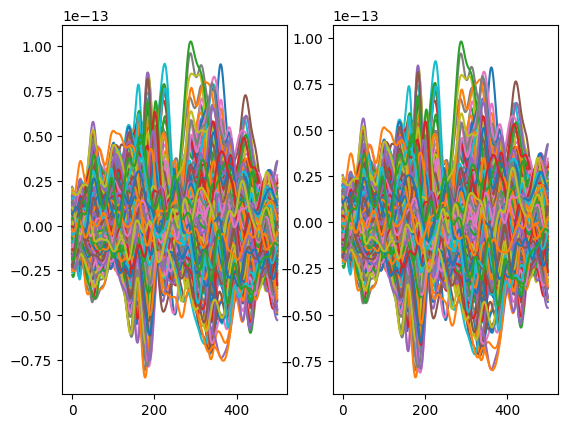

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].plot(eeg_data.T)
ax[1].plot((eeg_data-eeg_data.mean(0)).T)
plt.show()

In [ ]:
sc_file = data_file+ sub +'/weights.csv'
dist_file = data_file+ sub +'/distance.txt'
sc_df = pd.read_csv(sc_file, header=None)
sc =sc_df.values
dist = np.loadtxt(dist_file)

sc = np.log1p(sc) / np.linalg.norm(np.log1p(sc))
sc.shape

(184, 184)

<Axes: >

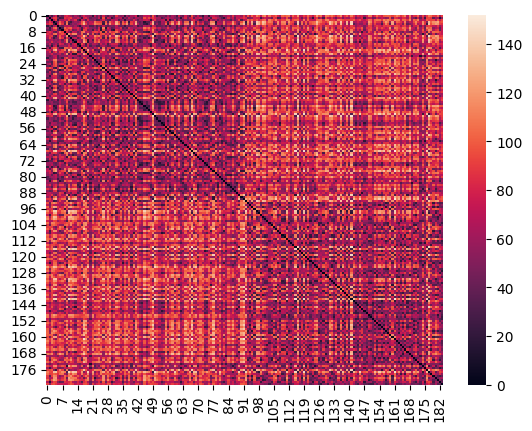

In [ ]:
sns.heatmap(dist)

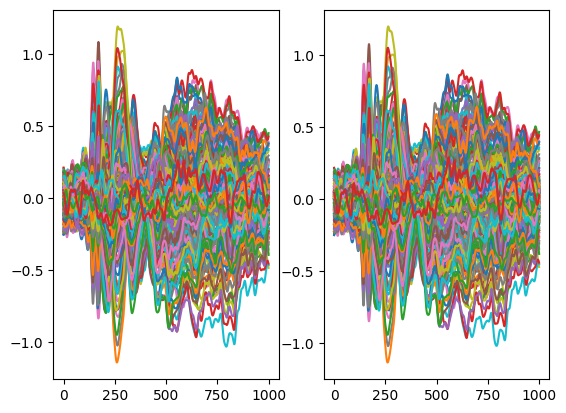

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].plot(eeg_data.T)
ax[1].plot((eeg_data-eeg_data.mean(0)).T)
plt.show()

In [ ]:
eeg_data.shape

(273, 500)

In [ ]:

sub = 0
mode = '_dev_ket'

#sc[200:,200:][sc[200:,200:] < sc[200:,200:].mean()+2*sc[200:,200:].std()]=0
#sc[200:,200:][sc[200:,200:] < sc[200:,200:].mean()+2*sc[200:,200:].std()] =0

#sc = np.log1p(sc_matrix)/np.linalg.norm(np.log1p(sc_matrix))

#sc = np.log1p(sc)/np.linalg.norm(np.log1p(sc))



#lm_v = np.zeros((output_size,node_size))


#['gm']:#[0, 1,2,3,5,6,7,8,9,10, 12,13,14,15,16,17,18]:#
#for i in range(data_high['only_high_trial'].shape[0]):
for s in range(0,1):
    print('sub: ', s)

    eeg_sub = eeg_data/np.abs(eeg_data).max()*2
    node_size = sc.shape[0]
    output_size = eeg_sub.shape[0]
    batch_size = 200
    step_size = 0.0001
    input_size = 3
    num_epoches = 120
    tr = 0.001
    state_size = 6
    base_batch_num = 50
    time_dim = eeg_sub.shape[1]
    hidden_size = int(tr/step_size)
    """ki0 =np.zeros((node_size,1)) #+0.1*np.random.randn(node_size,1)#stim_weights_thr[:,np.newaxis]
    ki0[35] =1
    ki0[124]=1"""
    ki0 =np.zeros((node_size,1))
    ki0[2] =1
    ki0[92+5]=1

    #file_leadfield = '/content/drive/MyDrive/EEG/leadfield_from_mne/sub'+ str(i+1).zfill(3)+'/leadfield.npy'
    #lm = np.load(file_leadfield, allow_pickle=True)
    """file_leadfield = '/content/drive/MyDrive/Model_DLPFC/' + sub2model + '/new_leadfield.npy'
    lm = np.load(file_leadfield, allow_pickle=True)
    lm = lm /5000 #np.linalg.norm(lm)"""
    data_mean = dataloader(eeg_sub.T, num_epoches, batch_size)
    lm = np.zeros((output_size,node_size))
    lm_v = 0.1*np.random.randn(output_size,node_size)
    """par = ParamsModel('JR', A = [3.25, 0], a= [100, 10], B = [22, 0], b = [50, 10], g=[40, 10], g_f=[1, 0], g_b=[1, 0],\
                    c1 = [135, 0], c2 = [135*0.8, 5], c3 = [135*0.25, 0], c4 = [135*0.25, 5],\
                    std_in=[1, 100], vmax= [5, 0], v0=[6,0], r=[0.56, 0], y0=[2 , 4],\
                    mu = [1., 6.25], #k = [10, .3],
                    #cy0 = [5, 0], ki=[ki0, 0], k_aud=[k_aud0, 0], lm=[lm, 1.0 * np.ones((output_size, 200))+lm_v], \
                    cy0 = [50, 0], ki=[ki0, 0], lm=[lm, .1 * np.ones((output_size, node_size))+lm_v])#, w_ll=[sc, 50 * np.ones((node_size, node_size))])"""
    par = ParamsModel('JR', A = [3.25, 0], a= [100, 1], B = [22, 0], b = [50, 1], g=[400, 1], g_f=[10, 1], g_b=[10, 1],\
                    c1 = [135, 1], c2 = [135*0.8, 1], c3 = [135*0.25, 0.8], c4 = [135*0.25, 1],\
                    std_in=[-5, 0.1], vmax= [5, 0], v0=[6,0], r=[0.56, 0], y0=[2 , 0.2],\
                    mu = [1., 0.2], k = [5, 0.2],
                    #cy0 = [5, 0], ki=[ki0, 0], k_aud=[k_aud0, 0], lm=[lm, 1.0 * np.ones((output_size, 200))+lm_v], \
                    cy0 = [50, 1], ki=[ki0, 0.], lm=[lm, 1 * np.ones((output_size, node_size))+lm_v])#, w_ll=[sc, 50 * np.ones((node_size, node_size))])

    model = RNNJANSEN(node_size, batch_size, step_size, output_size, tr, sc, lm, dist, True, False, par)

    # initial model parameters and set the fitted model parameter in Tensors
    model.setModelParameters()

    # call model fit method
    F = Model_fitting(model, data_mean, num_epoches, 0)#data_mean[:,:,int(2000 * target_sfreq / 7500):int(4000 * target_sfreq / 7500)], num_epoches, 0)

    #fit data(train)
    u = np.zeros((node_size,hidden_size,time_dim))
    #u[:,:,120:130,0]= 00
    u[:,:,90:130]= 2000
    #u[:,:,0:1, 2]= 0
    #u[:,:,100:21,1]= 70

    output_train = F.train(u=u)




    output_test = F.test(base_batch_num, u=u)


    fig, ax = plt.subplots(1, 1, figsize=(5, 4))

    ax.imshow(F.model.sc_fitted.detach().numpy(), cmap = 'bwr')
    plt.show()

    """filename = '/content/drive/MyDrive/Work/Sciencing/Data/test_data/sub_'+subs[sub]+ mode+ '_fittingresults_stim_exp.pkl'
    with open(filename, 'wb') as f:
        pickle.dump(F, f)

    outfilename = '/content/drive/MyDrive/Work/Sciencing/Data/test_data/sub_'+subs[sub]+mode+ '_simEEG_stim_exp.pkl'


    with open(outfilename, 'wb') as f:
        pickle.dump(F.output_sim, f)"""

    fig, ax = plt.subplots(1,3, figsize=(12,8))
    ax[0].plot((F.output_sim.P_test).T)
    ax[0].set_title('Test: sourced EEG')
    ax[1].plot(F.output_sim.eeg_test.T)
    ax[1].set_title('Test')
    ax[2].plot(eeg_sub.T)
    ax[2].set_title('empirical')
    plt.show()
    print(F.model.state_dict())
#end_time =  time.time()
#print('running time is  {0} \'s'.format(end_time - start_time ))

sub:  0
Parameter containing:
tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]], requires_grad=True)
epoch:  0 -3004.437
epoch:  0 0.5289535239625718 cos_sim:  -0.1271414665170325
epoch:  1 -7589.235
epoch:  1 0.6766366078428038 cos_sim:  -0.06777962758784349
epoch:  2 -11749.637
epoch:  2 0.6726814755778974 cos_sim:  -0.07456786964198031
epoch:  3 -15547.83
epoch:  3 0.3415568769951992 cos_sim:  -0.09247262824070053
epoch:  4 -19032.748
epoch:  4 0.25621535638238835 cos_sim:  -0.10114925035596906
epoch:  5 -22243.05
epoch:  5 0.324058094363249 cos_sim:  -0.09771303292317644
epoch:  6 -25210.895
epoch:  6 0.6266437155312762 cos_sim:  -0.08499712333544523
epoch:  7 -27964.05
epoch:  7 0.6922306252339757 cos_sim:  -0.06902902370857679
epoch:  8 -30526.4

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-44-f86b6e4c62e2>", line 81, in <cell line: 18>
    output_test = F.test(base_batch_num, u=u)
  File "<ipython-input-7-37ae29ee549f>", line 305, in test
    u_hat[:, :, base_window_num * self.model.TRs_per_window:] = self.u
ValueError: could not broadcast input array from shape (184,10,500) into shape (184,10,400)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'ValueError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/d

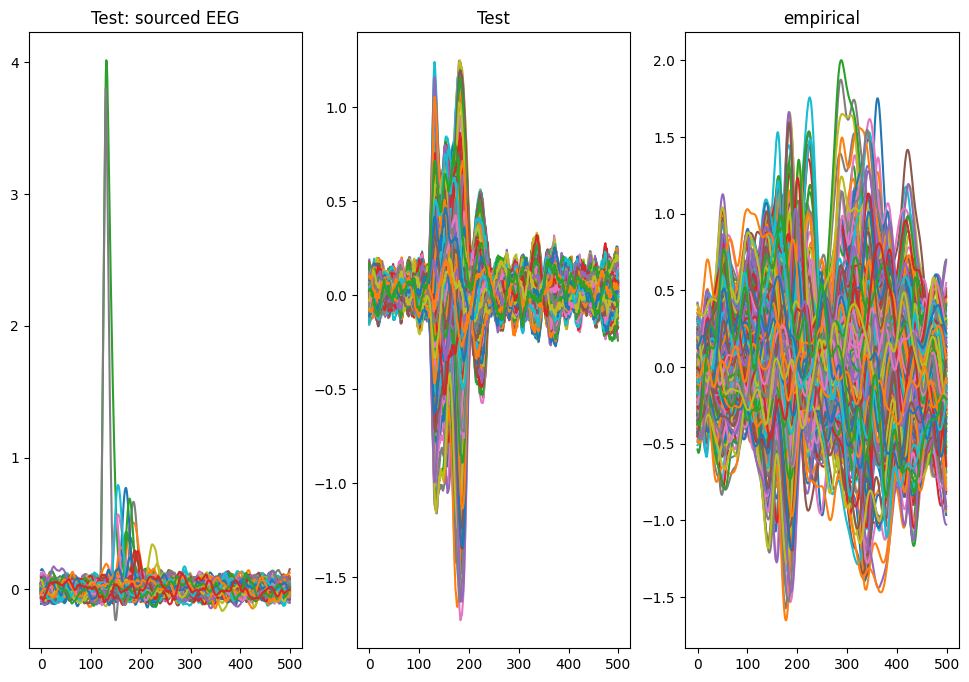

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(12,8))
ax[0].plot((F.output_sim.P_test).T)
ax[0].set_title('Test: sourced EEG')
ax[1].plot(F.output_sim.eeg_test.T)
ax[1].set_title('Test')
ax[2].plot(eeg_sub.T)
ax[2].set_title('empirical')
plt.show()

In [ ]:
model.sc

,0,1,2,3,4,5,6,7,8,9,...,174,175,176,177,178,179,180,181,182,183
0,0.000000,0.001972,0.009632,0.000005,0.000093,0.029347,0.000553,0.018466,0.003406,3.240870e-06,...,0.000000,0.001621,0.000037,0.000000,0.000025,0.000102,0.000003,0.000053,0.003119,0.000271
1,0.001972,0.000000,0.001225,0.000000,0.000188,0.002583,0.005052,0.008326,0.005404,1.573404e-04,...,0.000113,0.022976,0.000045,0.000098,0.000005,0.001863,0.000068,0.000129,0.015698,0.000308
2,0.009632,0.001225,0.000000,0.000005,0.000152,0.025409,0.009711,0.010032,0.004557,4.272050e-06,...,0.000001,0.002459,0.000036,0.000005,0.000000,0.000750,0.000016,0.000110,0.000619,0.000017
3,0.000005,0.000000,0.000005,0.000000,0.023543,0.000009,0.000010,0.000034,0.000674,2.051099e-06,...,0.000000,0.000008,0.000181,0.000000,0.000000,0.000002,0.000000,0.000011,0.000000,0.000001
4,0.000093,0.000188,0.000152,0.023543,0.000000,0.000164,0.000500,0.000703,0.019175,1.411286e-05,...,0.000000,0.000226,0.009352,0.000002,0.000001,0.000192,0.000011,0.000123,0.000096,0.000023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,0.000102,0.001863,0.000750,0.000002,0.000192,0.000356,0.005142,0.001002,0.002003,8.631497e-07,...,0.000000,0.017128,0.000307,0.000007,0.000025,0.000000,0.000034,0.004523,0.000503,0.001212
180,0.000003,0.000068,0.000016,0.000000,0.000011,0.000029,0.000039,0.000036,0.000251,5.900743e-03,...,0.019133,0.013003,0.000005,0.005361,0.000025,0.000034,0.000000,0.000810,0.000687,0.000029
181,0.000053,0.000129,0.000110,0.000011,0.000123,0.000089,0.000411,0.000315,0.001032,1.210002e-05,...,0.000007,0.006298,0.000118,0.000010,0.000426,0.004523,0.000810,0.000000,0.002053,0.002608
182,0.003119,0.015698,0.000619,0.000000,0.000096,0.001610,0.003645,0.005664,0.001638,0.000000e+00,...,0.000000,0.031754,0.000309,0.000009,0.000028,0.000503,0.000687,0.002053,0.000000,0.001943


In [ ]:
dist.shape

(184, 184)

In [ ]:
filename = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/noise_evoked_fittingresults_stim_exp.pkl'

with open(filename, 'wb') as f:
    pickle.dump(F, f)

In [ ]:
filename = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/noise_evoked_fittingresults_stim_exp.pkl'

with open(filename, 'rb') as f:
    F_noise = pickle.load(f)

filename = '/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/verb_evoked_fittingresults_stim_exp.pkl'

with open(filename, 'rb') as f:
    F_verb = pickle.load(f)

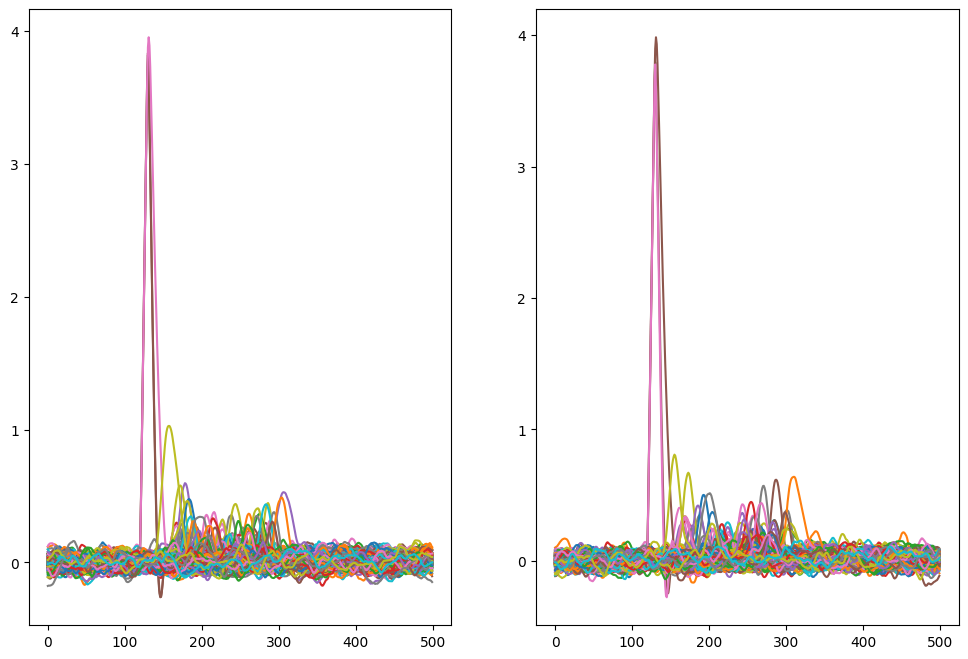

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,8))
ax[0].plot(F_verb.output_sim.P_test.T)
ax[1].plot(F_noise.output_sim.P_test.T)
plt.show()

In [ ]:
data_mean = dataloader(eeg_verb_data.T, num_epoches, batch_size)
data_mean.shape
F_verb.ts=data_mean
#fit data(train)
u = np.zeros((node_size,hidden_size,1000))
#u[:,:,120:130,0]= 00
u[:,:,120:130]= 2000
#u[:,:,0:1, 2]= 0
#u[:,:,100:21,1]= 70





output_test = F_verb.test(50, u=u)

0.8997764370107788 cos_sim:  0.6043762676220776


In [ ]:
data_mean = dataloader(eeg_noise_data.T, num_epoches, batch_size)
data_mean.shape
F_noise.ts=data_mean
#fit data(train)
u = np.zeros((node_size,hidden_size,1000))
#u[:,:,120:130,0]= 00
u[:,:,120:130]= 2000
#u[:,:,0:1, 2]= 0
#u[:,:,100:21,1]= 70





output_test = F_noise.test(50, u=u)

0.8699242180671644 cos_sim:  0.5315878653485119


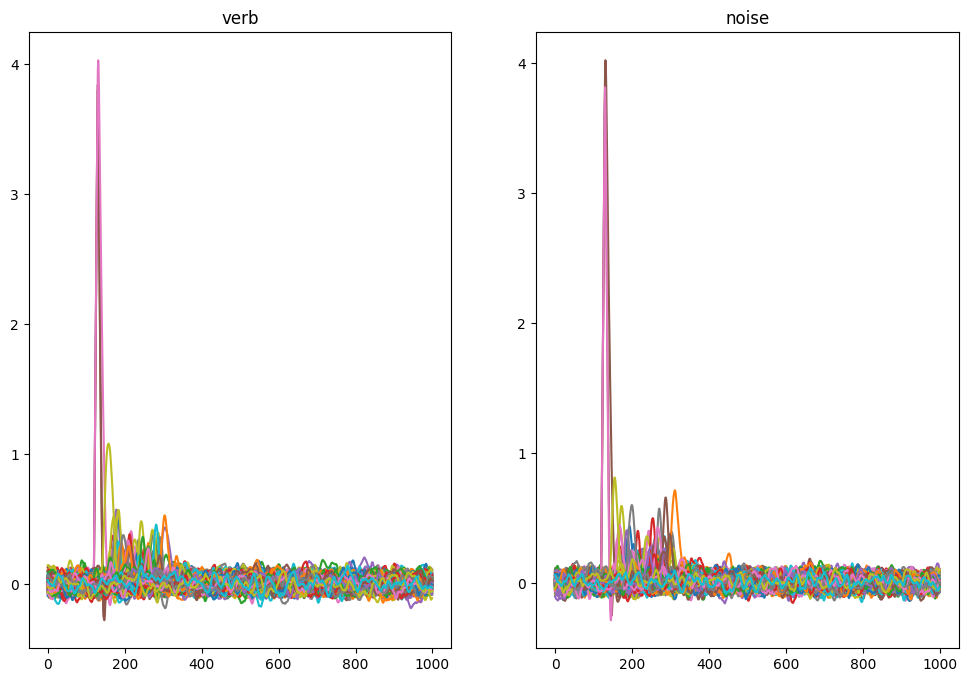

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,8))
ax[0].plot(F_verb.output_sim.P_test.T)
ax[0].set_title('verb')
ax[1].plot(F_noise.output_sim.P_test.T)
ax[1].set_title('noise')
plt.show()

In [ ]:
#stim_weights = np.load('/content/drive/MyDrive/TORONTO/Model_DLPFC/stim_weight_dlpfc.npy')

url = 'https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Centroid_coordinates/Schaefer2018_200Parcels_7Networks_order_FSLMNI152_2mm.Centroid_RAS.csv'
labels = pd.read_csv(url)
labels = labels['ROI Name']


In [ ]:
np.array(labels)[np.any((F_verb.output_sim.P_test[:,280:320])> 0.3, axis=1)]

array(['7Networks_LH_Limbic_OFC_2', '7Networks_LH_Limbic_TempPole_1',
       '7Networks_LH_Limbic_TempPole_3', '7Networks_LH_Cont_OFC_1',
       '7Networks_LH_Cont_Cing_2', '7Networks_RH_SomMot_3',
       '7Networks_RH_Limbic_OFC_2', '7Networks_RH_Limbic_TempPole_1'],
      dtype=object)

In [ ]:
np.array(labels)[np.any((F_noise.output_sim.P_test[:,280:320])> 0.3, axis=1)]

array(['7Networks_LH_Vis_10', '7Networks_LH_Limbic_OFC_2',
       '7Networks_LH_Default_Temp_3', '7Networks_RH_SomMot_3',
       '7Networks_RH_SomMot_8', '7Networks_RH_Limbic_TempPole_1',
       '7Networks_RH_Cont_PFCl_7'], dtype=object)

In [ ]:
np.array(labels)[np.any(np.abs(F_verb.output_sim.P_test[:,500:1000])> 0.16, axis=1)]

array(['7Networks_LH_SomMot_11', '7Networks_LH_SomMot_16',
       '7Networks_LH_DorsAttn_FEF_1', '7Networks_LH_Limbic_OFC_1',
       '7Networks_LH_Cont_Cing_2', '7Networks_LH_Default_PFC_1',
       '7Networks_LH_Default_PFC_3', '7Networks_RH_Vis_1',
       '7Networks_RH_SomMot_10', '7Networks_RH_SomMot_14',
       '7Networks_RH_SomMot_17', '7Networks_RH_Default_Par_3'],
      dtype=object)

In [ ]:
np.array(labels)[np.any(np.abs(F_noise.output_sim.P_test[:,500:1000])> 0.16, axis=1)]

array(['7Networks_LH_Default_Temp_3', '7Networks_RH_SomMot_8',
       '7Networks_RH_SomMot_9'], dtype=object)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 274 out of 274 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 274 out of 274 | elapsed:    1.2s finished


Text(0.5, 0, 'Time (ms)')

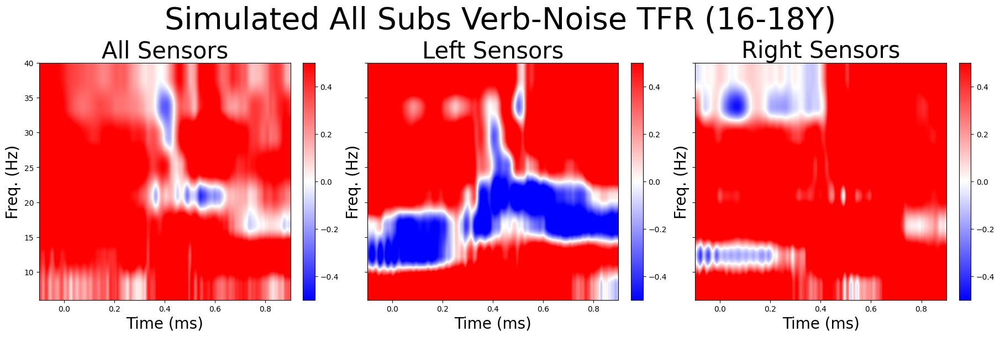

In [ ]:
from mne.time_frequency import tfr_multitaper
freqs = np.logspace(*np.log10([6, 40]), num=8)
cmap='bwr'
e_v_sim = mne.EvokedArray(F_verb.output_sim.eeg_test,data[0].info,tmin=-0.1)
e_n_sim = mne.EvokedArray(F_noise.output_sim.eeg_test,data[0].info,tmin=-0.1)

v_tfr = tfr_multitaper(e_v_sim,
                                                   freqs=freqs,
                                                  n_cycles=freqs/2,return_itc=False)
n_tfr = mne.time_frequency.tfr_multitaper(e_n_sim,
                                                   freqs=freqs,
                                                  n_cycles=freqs/2,return_itc=False)

"""subt_log_tfr = np.mean(np.log(v_tfr.data) - np.log(n_tfr.data),axis=0)
L_subt_log_tfr = np.mean(np.log(v_tfr.data[24:24+33]) - np.log(n_tfr.data[24:24+33]),axis=0)
R_subt_log_tfr = np.mean(np.log(v_tfr.data[132+24:132+24+33]) - np.log(n_tfr.data[132+24:132+24+33]),axis=0)"""

subt_log_tfr = np.log(np.mean(v_tfr.data,axis=0)) - np.log(np.mean(n_tfr.data,axis=0))
L_subt_log_tfr = np.log(np.mean(v_tfr.data[24:24+33],axis=0)) - np.log(np.mean(n_tfr.data[24:24+33],axis=0))
R_subt_log_tfr = np.log(np.mean(v_tfr.data[132+24:132+24+33],axis=0)) - np.log(np.mean(n_tfr.data[132+24:132+24+33],axis=0))

fig, axs = plt.subplots(1, 3,constrained_layout=True, figsize=(18,6), sharex=True, sharey=True,)
fig.suptitle('Simulated All Subs Verb-Noise TFR (16-18Y)', fontsize=40)
times = data[0].times[401:1401]
extent = (times[0], times[-1], freqs[0], freqs[-1])
im = axs[0].imshow(subt_log_tfr, extent=extent, aspect="auto", cmap=cmap, vmin=-.5, vmax=.5)
plt.colorbar(im,ax=axs[0])
axs[0].set_title("All Sensors", fontsize=30)
axs[0].set_ylabel('Freq. (Hz)',fontsize=20)
axs[0].set_xlabel('Time (ms)',fontsize=20)
im1 = axs[1].imshow(L_subt_log_tfr, extent=extent, aspect="auto", cmap=cmap, vmin=-0.5, vmax=0.5)
plt.colorbar(im1,ax=axs[1])
axs[1].set_title("Left Sensors", fontsize=30)
axs[1].set_ylabel('Freq. (Hz)',fontsize=20)
axs[1].set_xlabel('Time (ms)',fontsize=20)
im2 = axs[2].imshow(R_subt_log_tfr, extent=extent, aspect="auto", cmap=cmap, vmin=-0.5, vmax=0.5)
plt.colorbar(im2,ax=axs[2])
axs[2].set_title("Right Sensors", fontsize=30)
axs[2].set_ylabel('Freq. (Hz)',fontsize=20)
axs[2].set_xlabel('Time (ms)',fontsize=20)

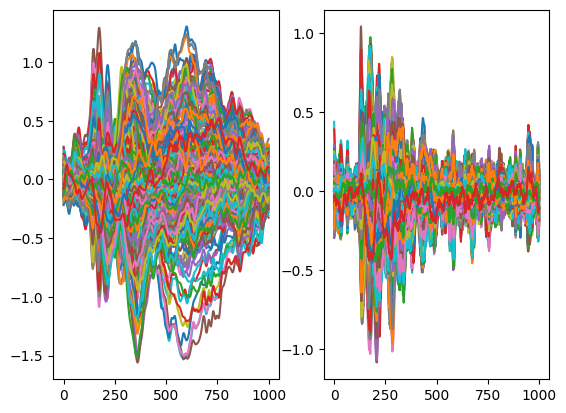

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].plot(eeg_verb_data.T)
ax[1].plot((F_verb.output_sim.eeg_test).T)
plt.show()

In [ ]:
F_verb.output_sim.eeg_test.shape

(274, 1000)

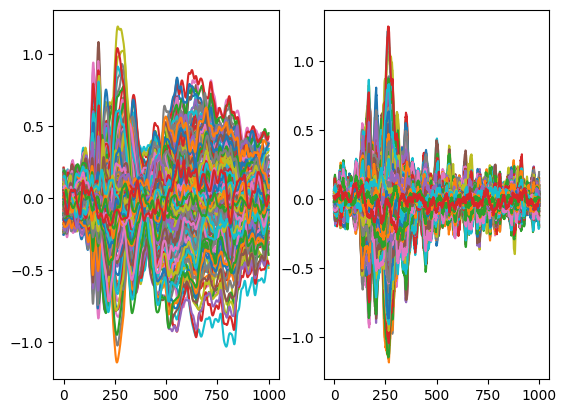

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].plot(eeg_noise_data.T)
ax[1].plot((F_noise.output_sim.eeg_test).T)
plt.show()

In [ ]:
np.savetxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/verb_sourceEEG_1000_trial.txt', F_verb.output_sim.P_test)
np.savetxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/noise_sourceEEG_1000_trail.txt', F_noise.output_sim.P_test)

In [ ]:
np.savetxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/verb_simEEG_1000_tri.txt', F_verb.output_sim.eeg_test)
np.savetxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/noise_simEEG_1000.txt', F_noise.output_sim.eeg_test)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-26-dd9716b52218>", line 1, in <cell line: 1>
    np.savetxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/verb_simEEG_1000_trial1.txt', F_verb.output_sim.eeg_test)
  File "<__array_function__ internals>", line 180, in savetxt
  File "/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py", line 1384, in savetxt
    fh = np.lib._datasource.open(fname, 'wt', encoding=encoding)
  File "/usr/local/lib/python3.10/dist-packages/numpy/lib/_datasource.py", line 192, in open
    ds = DataSource(destpath)
  File "/usr/local/lib/python3.10/dist-packages/numpy/lib/_datasource.py", line 249, in __init__
    self._destpath = os.path.abspath(destpath)
  File "/usr/lib/python3.10/posixpath.py", line 384, in abspath
    cwd = os.getcwd()
OSError: [Errno 107] Transport en

In [ ]:
from mne.time_frequency import tfr_multitaper
freqs = np.logspace(*np.log10([6, 40]), num=8)
noise_psd =[]
verb_psd =[]
for i in range(1,71):
    eeg_verb =np.loadtxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/verb_simEEG_1000_trial'+str(i)+'.txt')
    eeg_noise = np.loadtxt('/content/drive/MyDrive/Work/Sciencing/Data/language_evoked/noise_simEEG_1000_trial'+str(i)+'.txt')



    e_v_sim = mne.EvokedArray(eeg_verb,data[0].info,tmin=-0.1)
    e_n_sim = mne.EvokedArray(eeg_noise,data[0].info,tmin=-0.1)

    v_tfr = tfr_multitaper(e_v_sim,
                                                      freqs=freqs,
                                                      n_cycles=freqs/2,return_itc=False)
    n_tfr = mne.time_frequency.tfr_multitaper(e_n_sim,
                                                      freqs=freqs,
                                                      n_cycles=freqs/2,return_itc=False)

    """subt_log_tfr = np.mean(np.log(v_tfr.data) - np.log(n_tfr.data),axis=0)
    L_subt_log_tfr = np.mean(np.log(v_tfr.data[24:24+33]) - np.log(n_tfr.data[24:24+33]),axis=0)
    R_subt_log_tfr = np.mean(np.log(v_tfr.data[132+24:132+24+33]) - np.log(n_tfr.data[132+24:132+24+33]),axis=0)"""



    noise_psd.append(np.log(np.mean(n_tfr.data[24:24+33],axis=0)))
    verb_psd.append(np.log(np.mean(v_tfr.data[24:24+33],axis=0)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 274 out of 274 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 274 out of 274 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with

In [ ]:
noise_psd=np.array(noise_psd)
verb_psd=np.array(verb_psd)
noise_psd.shape

(70, 8, 1000)

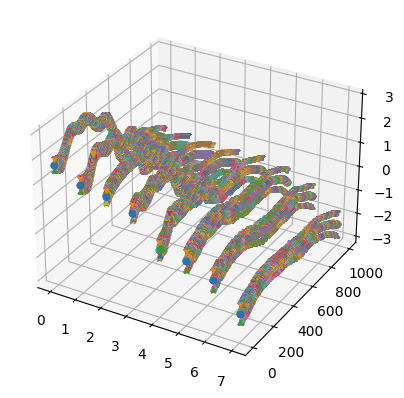

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
for i in range(8):
  for j in range(1000):
    ax.scatter(i, j, (noise_psd-noise_psd.mean()).mean(0)[i,j], marker='o')
    ax.scatter(i, j, ((noise_psd-noise_psd.mean()).mean(0)+(noise_psd-noise_psd.mean()).std(0))[i,j], marker='1')
    ax.scatter(i, j, ((noise_psd-noise_psd.mean()).mean(0)-(noise_psd-noise_psd.mean()).std(0))[i,j], marker='2')



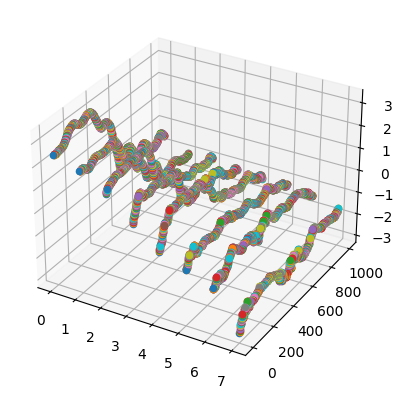

In [ ]:
fig = plt.figure()
k=0
ax = fig.add_subplot(projection='3d')
for i in range(8):
  for j in range(1000):
    ax.scatter(i, j, (verb_psd-verb_psd.mean())[k][i,j], marker='o')


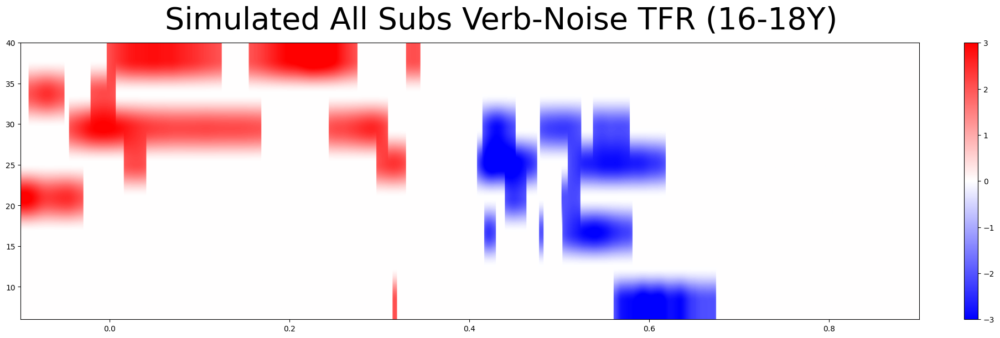

In [ ]:
k= 40
cmap='bwr'
score_psd= ((verb_psd-verb_psd.mean())[k] -(noise_psd-noise_psd.mean()).mean(0))/(noise_psd-noise_psd.mean()).std(0)
score_psd[np.abs(score_psd)<2]=0
fig, axs = plt.subplots(1, 1,constrained_layout=True, figsize=(18,6), sharex=True, sharey=True,)
fig.suptitle('Simulated All Subs Verb-Noise TFR (16-18Y)', fontsize=40)
times = data[0].times[401:1401]
extent = (times[0], times[-1], freqs[0], freqs[-1])
im = axs.imshow(score_psd, extent=extent, aspect="auto", cmap=cmap, vmin=-3, vmax=3)
plt.colorbar(im,ax=axs)

In [ ]:
sub = 0
mode = '_dev_ket'

#sc[200:,200:][sc[200:,200:] < sc[200:,200:].mean()+2*sc[200:,200:].std()]=0
#sc[200:,200:][sc[200:,200:] < sc[200:,200:].mean()+2*sc[200:,200:].std()] =0

#sc = np.log1p(sc_matrix)/np.linalg.norm(np.log1p(sc_matrix))

#sc = np.log1p(sc)/np.linalg.norm(np.log1p(sc))



#lm_v = np.zeros((output_size,node_size))


#['gm']:#[0, 1,2,3,5,6,7,8,9,10, 12,13,14,15,16,17,18]:#
#for i in range(data_high['only_high_trial'].shape[0]):
for sub in range(9,19):
    print('sub: ', sub)
    sub2model = subs[sub]
    eeg_sub = eeg_data[sub]
    node_size = stim_weights_thr.shape[0]
    output_size = eeg_sub.shape[0]
    batch_size = 16
    step_size = 0.0001
    input_size = 3
    num_epoches = 120
    tr = 0.0039
    state_size = 6
    base_batch_num = 300
    time_dim = eeg_sub.shape[1]
    hidden_size = int(tr/step_size)
    ki0 =stim_weights_thr[:,np.newaxis]




    #file_leadfield = '/content/drive/MyDrive/EEG/leadfield_from_mne/sub'+ str(i+1).zfill(3)+'/leadfield.npy'
    #lm = np.load(file_leadfield, allow_pickle=True)
    """file_leadfield = '/content/drive/MyDrive/Model_DLPFC/' + sub2model + '/new_leadfield.npy'
    lm = np.load(file_leadfield, allow_pickle=True)
    lm = lm /5000 #np.linalg.norm(lm)"""
    data_mean = dataloader(eeg_sub.T, num_epoches, batch_size)
    lm = np.zeros((output_size,200))
    lm_v = np.zeros((output_size,200))
    """par = ParamsModel('JR', A = [3.25, 0], a= [100, 10], B = [22, 0], b = [50, 10], g=[40, 10], g_f=[1, 0], g_b=[1, 0],\
                    c1 = [135, 0], c2 = [135*0.8, 5], c3 = [135*0.25, 0], c4 = [135*0.25, 5],\
                    std_in=[1, 100], vmax= [5, 0], v0=[6,0], r=[0.56, 0], y0=[2 , 4],\
                    mu = [1., 6.25], #k = [10, .3],
                    #cy0 = [5, 0], ki=[ki0, 0], k_aud=[k_aud0, 0], lm=[lm, 1.0 * np.ones((output_size, 200))+lm_v], \
                    cy0 = [50, 0], ki=[ki0, 0], lm=[lm, .1 * np.ones((output_size, node_size))+lm_v])#, w_ll=[sc, 50 * np.ones((node_size, node_size))])"""
    par = ParamsModel('JR', A = [3.25, 0], a= [100, 1], B = [22, 0], b = [50, 1], g=[40, 1], g_f=[1, 0], g_b=[1, 0],\
                    c1 = [135, 1], c2 = [135*0.8, 0], c3 = [135*0.25, 1/0.8], c4 = [135*0.25, 0],\
                    std_in=[1, 0.1], vmax= [5, 0], v0=[6,0], r=[0.56, 0], y0=[2 , 0.5],\
                    mu = [1., 0.2], #k = [10, .3],
                    #cy0 = [5, 0], ki=[ki0, 0], k_aud=[k_aud0, 0], lm=[lm, 1.0 * np.ones((output_size, 200))+lm_v], \
                    cy0 = [50, 1], ki=[ki0, 0], lm=[lm, .1 * np.ones((output_size, node_size))+lm_v])#, w_ll=[sc, 50 * np.ones((node_size, node_size))])

    model = RNNJANSEN(node_size, batch_size, step_size, output_size, tr, sc, lm, dist, True, False, par)

    # initial model parameters and set the fitted model parameter in Tensors
    model.setModelParameters()

    # call model fit method
    F = Model_fitting(model, data_mean, num_epoches, 0)#data_mean[:,:,int(2000 * target_sfreq / 7500):int(4000 * target_sfreq / 7500)], num_epoches, 0)

    #fit data(train)
    u = np.zeros((node_size,hidden_size,time_dim))
    #u[:,:,110:120,0]= 100
    u[:,:,28:31]= 50
    #u[:,:,0:1, 2]= 0
    #u[:,:,100:21,1]= 70

    output_train = F.train(u=u)

    u = np.zeros((node_size,hidden_size,time_dim))
    #u[:,:,110:120,0]= 200
    u[:,:,28:31]= 50
    #u[:,:,0:1, 2]= 0
    #u[:,:,200:210,1]= 1500


    output_test = F.test(base_batch_num, u=u)


    fig, ax = plt.subplots(1, 1, figsize=(5, 4))

    ax.imshow(F.model.sc_fitted.detach().numpy(), cmap = 'bwr')
    plt.show()

    filename = '/content/drive/MyDrive/Work/Sciencing/Data/test_data/sub_'+subs[sub]+ mode+ '_fittingresults_stim_exp.pkl'
    with open(filename, 'wb') as f:
        pickle.dump(F, f)

    outfilename = '/content/drive/MyDrive/Work/Sciencing/Data/test_data/sub_'+subs[sub]+mode+ '_simEEG_stim_exp.pkl'


    with open(outfilename, 'wb') as f:
        pickle.dump(F.output_sim, f)

    fig, ax = plt.subplots(1,3, figsize=(12,8))
    ax[0].plot((F.output_sim.P_test).T)
    ax[0].set_title('Test: sourced EEG')
    ax[1].plot(F.output_sim.eeg_test.T)
    ax[1].set_title('Test')
    ax[2].plot(eeg_sub.T)
    ax[2].set_title('empirical')
    plt.show()
    print(F.model.state_dict())
#end_time =  time.time()
#print('running time is  {0} \'s'.format(end_time - start_time ))

(200, 20, 500)

In [ ]:
output_test = F.test(base_batch_num, u=u)

ValueError: ignored

In [ ]:
F.model.state_dict()

OrderedDict([('w_bb',
              tensor([[ 0.0500, -2.1974, -2.1370,  ..., -1.8922, -1.8593, -1.8218],
                      [ 0.4794,  0.0500,  0.6247,  ...,  1.2214,  1.2737,  1.3179],
                      [-0.5417, -0.5773,  0.0500,  ..., -0.4823, -0.5101, -0.5220],
                      ...,
                      [ 2.7549,  2.4681,  2.4468,  ...,  0.0500,  1.7776,  2.1493],
                      [ 3.8353,  3.5420,  3.3296,  ...,  2.8442,  0.0500,  2.7405],
                      [ 2.7519,  2.2993,  2.1429,  ...,  1.9468,  1.4821,  0.0500]])),
             ('w_ff',
              tensor([[ 0.0500, -1.3929, -1.1564,  ..., -0.8332, -0.8016, -0.7572],
                      [ 1.2476,  0.0500,  1.3125,  ...,  1.1186,  1.0899,  1.0699],
                      [-0.2471, -0.2014,  0.0500,  ..., -0.2326, -0.2438, -0.2538],
                      ...,
                      [ 2.9275,  3.2710,  3.2299,  ...,  0.0500,  2.6127,  2.9613],
                      [ 4.2380,  3.9667,  3.7364,  ...,  3.

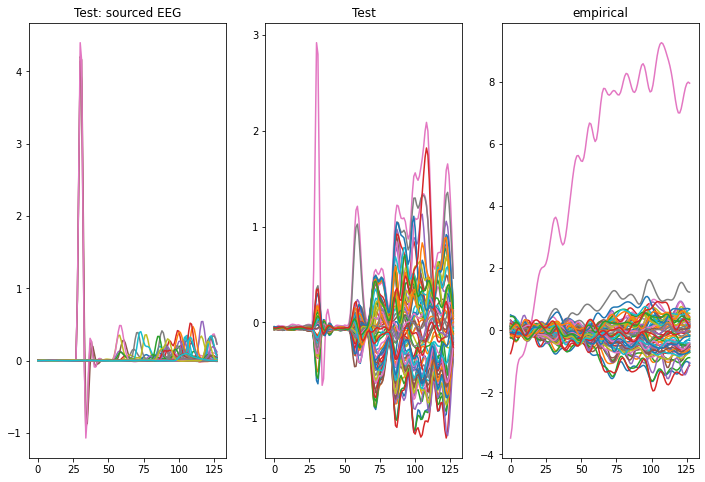

In [ ]:


fig, ax = plt.subplots(1,3, figsize=(12,8))
ax[0].plot((F.output_sim.P_test).T)
ax[0].set_title('Test: sourced EEG')
ax[1].plot(F.output_sim.eeg_test.T)
ax[1].set_title('Test')
ax[2].plot(eeg_sub.T)
ax[2].set_title('empirical')
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
node_size = 200
ax[0].imshow(F.model.sc_m_b.detach().numpy(), cmap='bwr', vmax=0.01)
ax[1].imshow(F.model.sc_m_f.detach().numpy(), cmap='bwr', vmax=0.01)
ax[2].imshow(F.model.sc_m_l.detach().numpy(), cmap='bwr', vmax=0.01)
ax[0].set_title('backward connection')
ax[1].set_title('forward connection')
ax[2].set_title('laterial connection')




plt.show()

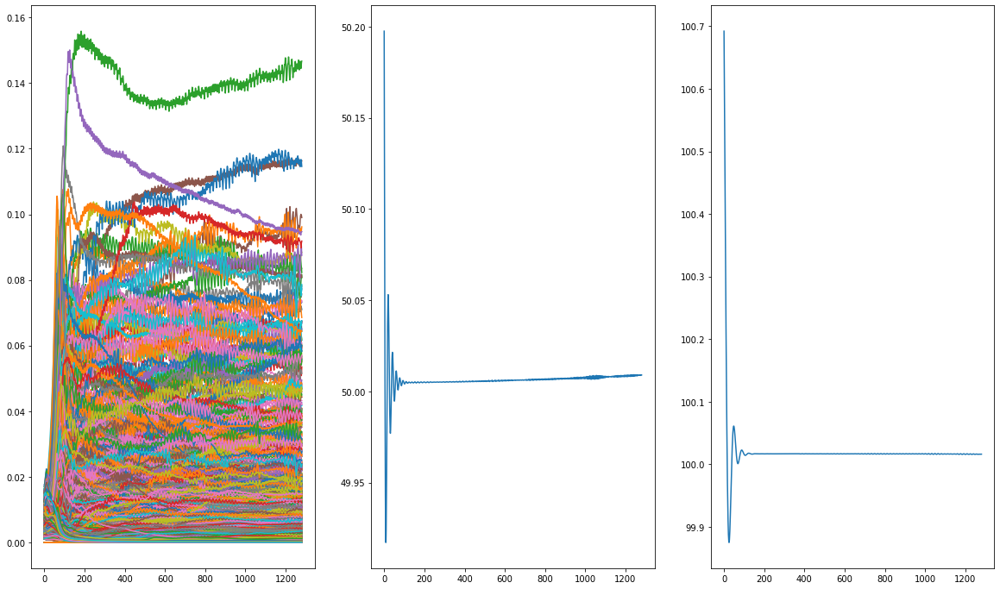

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].plot(F.output_sim.weights)
ax[1].plot(F.output_sim.b)
ax[2].plot(F.output_sim.a)
plt.show()


In [ ]:
epoched = mne.read_epochs(eeg_file, verbose=False)
evoked = epoched.average()

ts_args = dict(xlim=[-0.05,0.3])

ch, peak_locs1 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.07)
ch, peak_locs2 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.1)
ch, peak_locs3 = evoked.get_peak(ch_type='eeg', tmin=0.1, tmax=0.12)
ch, peak_locs4 = evoked.get_peak(ch_type='eeg', tmin=0.12, tmax=0.15)
ch, peak_locs5 = evoked.get_peak(ch_type='eeg', tmin=0.15, tmax=0.20)

times = [peak_locs1, peak_locs2, peak_locs3, peak_locs4, peak_locs5]


plot = evoked.plot_joint(ts_args=ts_args, times=times);



with open('/content/drive/MyDrive/Model_DLPFC/' + sub2model + '/sub_0_simEEG_stim_exp.pkl', 'rb') as f:
    data = pickle.load(f)

prova = signal.resample(data.eeg_test, 2000, axis=1)


simulated_EEG_st = evoked.copy()

simulated_EEG_st.data[:,2000:4000] = 1*prova
ch, peak_locs1 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=-0.05, tmax=0.05)
ch, peak_locs2 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.05, tmax=0.1)
ch, peak_locs3 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.1, tmax=0.12)
ch, peak_locs4 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.12, tmax=0.15)
ch, peak_locs5 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.15, tmax=0.20)

ymin = -(np.max(simulated_EEG_st.data[:,2000:4000])) * 1000000
ymax = (np.max(simulated_EEG_st.data[:,2000:4000])) * 1000000

ts_args = dict(xlim=[-0.05,0.3], ylim=dict(eeg=[ymin, ymax]))

times = [peak_locs1, peak_locs2, peak_locs3, peak_locs4, peak_locs5]

simulated_joint_st = simulated_EEG_st.plot_joint(ts_args=ts_args, times=times)

ValueError: ignored

## Power Spectrum

In [ ]:
%%capture
!pip install fooof
from fooof.plts.spectra import plot_spectrum, plot_spectra

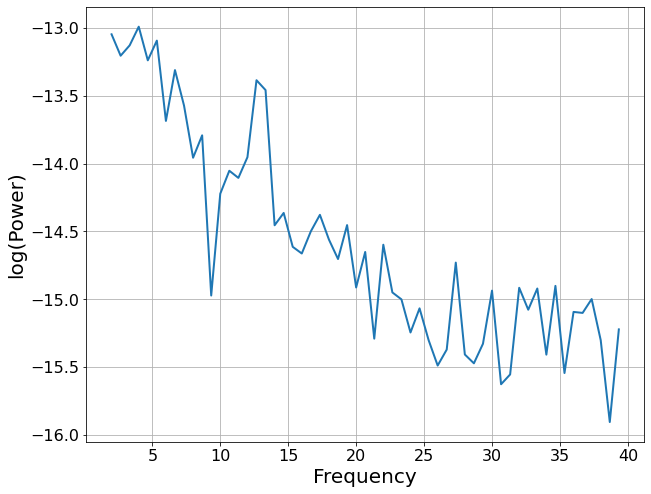

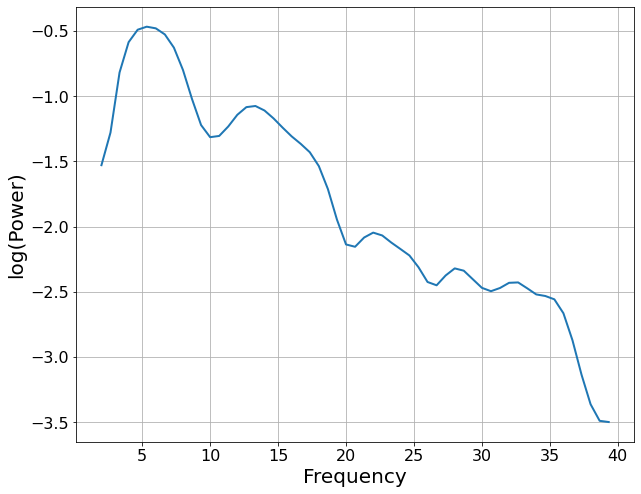

In [ ]:
#psds_real, freqs_real = mne.time_frequency.psd_welch(evoked, fmin=2, fmax=40, verbose=False,  n_fft=6000)
#psds_sim, freqs_sim = mne.time_frequency.psd_welch(simulated_EEG_st,  fmin=2, fmax=40, verbose=False,  n_fft=6000)

f_sim, Pxx_sim = scipy.signal.periodogram(simulated_EEG_st.data, fs=evoked.info['sfreq'], window='boxcar', nfft=None, detrend='constant', return_onesided=True, scaling='density', axis=- 1)

f_real, Pxx_real = scipy.signal.periodogram(evoked.data, fs=evoked.info['sfreq'], window='boxcar', nfft=None, detrend='constant', return_onesided=True, scaling='density', axis=- 1)

plot_spectrum(f_real[3:np.where(f_real==40)[0][0]], np.mean(Pxx_real[:,3:np.where(f_real==40)[0][0]], axis=0), log_powers=True)

plot_spectrum(f_sim[3:np.where(f_sim==40)[0][0]], np.mean(Pxx_sim[:,3:np.where(f_sim==40)[0][0]], axis=0), log_powers=True)

## Inject stimulus to M1

In [ ]:
with open('/content/drive/MyDrive/TORONTO/Model_DLPFC/' + sub2model + '/sub_0_fittingresults_stim_exp.pkl', 'rb') as f:
    F = pickle.load(f)

#data.model.w_bb.detach().numpy()

stim_weights_file = '/content/drive/MyDrive/TORONTO/EEG/stim_weights.npy'
stim_weights_motor = np.load(stim_weights_file) + 0.3
stim_weights_motor =stim_weights_motor[:,np.newaxis]

F.model.ki = torch.tensor(stim_weights_motor, dtype=torch.float32)


start_time = time.time()
node_size = stim_weights_thr.shape[0]
output_size = eeg_data.shape[0]
batch_size = 20
step_size = 0.0001
input_size = 3
num_epoches = 150
tr = 0.001
state_size = 6
base_batch_num = 20
time_dim = 400
hidden_size = int(tr/step_size)


u = np.zeros((node_size,hidden_size,time_dim, input_size))
u[:,:,110:120,0]= 1000
u[:,:,0:20, 2]= 50
#u[:,:,200:210,1]= 1500
X0 = np.random.uniform(0, 5, (node_size, state_size))
hE0 = np.random.uniform(0, 5, (node_size, 500))

F.test(X0, hE0, base_batch_num, u=u)



prova = signal.resample(F.output_sim.eeg_test, 2000, axis=1)


simulated_EEG_st = evoked.copy()

simulated_EEG_st.data[:,2000:4000] = prova
ch, peak_locs1 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=-0.05, tmax=0.05)
ch, peak_locs2 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.05, tmax=0.1)
ch, peak_locs3 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.1, tmax=0.12)
ch, peak_locs4 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.12, tmax=0.15)
ch, peak_locs5 = simulated_EEG_st.get_peak(ch_type='eeg', tmin=0.15, tmax=0.20)

ymin = -(np.max(simulated_EEG_st.data[:,2000:4000])) * 600000
ymax = (np.max(simulated_EEG_st.data[:,2000:4000])) * 600000

ts_args = dict(xlim=[-0.05,0.3], ylim=dict(eeg=[ymin, ymax]))

times = [peak_locs1, peak_locs2, peak_locs3, peak_locs4, peak_locs5]

simulated_joint_st = simulated_EEG_st.plot_joint(ts_args=ts_args, times=times)

FileNotFoundError: ignored

In [ ]:
 F.test(base_batch_num, u=u)

0.778832007879035 cos_sim:  0.4322097744178994


##Markov chain

In [ ]:
import numpy as np
from scipy.linalg import fractional_matrix_power

from scipy.stats import norm
from sklearn.cluster import KMeans
from scipy.signal import hilbert

#def eigen(X):
#|
#	#machine epsilon used as tolerance
#	eps = np.finfo(float).eps
#
#	U,D = np.eig(X)
#
#	D = np.diag(D)






def gsvd(A, M=[], W=[], exp=0.5):

	if M == []:
		M = np.identity(A.shape[0])
	if W == []:
		W = np.identity(A.shape[1])

	#save some typing
	matpow = fractional_matrix_power

	Mexp = matpow(M,exp)
	Wexp = matpow(W,exp)

	Ahat = np.matmul(np.matmul(Mexp,A),Wexp)

	U,S,Vt = np.linalg.svd(Ahat)

	Uhat = np.matmul(matpow(M,-exp),U)
	signb = Uhat[0,0] > 0
	sign = 1
	if not signb:
		sign = -1

	Uhat *= sign
	Vhat = np.matmul(matpow(W,-exp),np.transpose(Vt))
	Vhat *= sign
	return (Uhat,S,Vhat)


def get_leads_ts(analytic_signal, n_ev):
    phase=np.angle(analytic_signal)
    #phase=np.unwrap(np.angle(analytic_signal))
    #Leads = []
    """networks = []
    mask = np.tril_indices(phase.shape[1], -1)
    for i in range(phase.shape[0]):
        FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
        FC_inst= 0.5*(FC_inst+FC_inst.T)
        networks.append(FC_inst[mask])
        #Leads.append(FC_inst.ravel())#/np.sqrt((FC_inst.ravel()**2).sum()))
    Y=np.array(networks)

    C = np.corrcoef(Y)#Y.dot(Y.T)
    U, D, V = gsvd(C)#np.linalg.svd(C)
    del networks
    del Y
    weight = U[:,0]/U[:,0].sum()"""
    S_plus = np.zeros((phase.shape[1],phase.shape[1]))
    for i in range(phase.shape[0]):
        FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
        FC_inst= 0.5*(FC_inst+FC_inst.T)
        S_plus += FC_inst/(0.01*phase.shape[0])#*weight[i]
    U, D, V = np.linalg.svd(S_plus/100)#gsvd(S_plus)#
    Ft = U.dot(np.diag(1./D))
    F = U.dot(np.diag(np.sqrt(D)))

    S_transformed = np.zeros_like(phase)

    if n_ev==12:
        for i in range(phase.shape[0]):
            FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
            FC_inst= 0.5*(FC_inst+FC_inst.T)
            S_transformed.append(FC_inst.dot(Ft[:,:2]).ravel(order='F'))
    else:
        for i in range(phase.shape[0]):
            FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
            FC_inst= 0.5*(FC_inst+FC_inst.T)
            S_transformed[i,:] = FC_inst.dot(Ft)[:,n_ev-1]

    return S_transformed



def plot_centers(centers, labels, labels_ls, Noev, y_L,y_H, thresh):
    num_subplots=centers.shape[0]
    if num_subplots %3 ==0:
        num_rows = num_subplots//3
    else:
        num_rows = num_subplots//3 +1
    fig, ax = plt.subplots(num_rows, 3, figsize=(12,8))
    for i in range(num_subplots):
        if num_rows> 1:
            ax[i//3, i%3].plot(centers[i,:])
            ax[i//3, i%3].set_ylim([y_L, y_H])
            ax[i//3, i%3].set_title(str(100*np.sum(labels==i)/len(labels)) + "%")
            """if Noev == 1:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:].argmax()], (centers[i,:].argmax(), centers[i,:].max()))
            elif Noev == 2:
                rois=np.arange(len(labels_ls))[np.abs(centers[i,:]) >=thresh]
                print(rois+1)
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i//3, i%3].annotate(labels_ls[rois[roi]], (rois[roi], centers[i,rois[roi]]))
            else:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:len(labels_ls)].argmax()], (centers[i,:len(labels_ls)].argmax(), centers[i,:len(labels_ls)].max()))
                rois=np.arange(len(labels_ls))[np.abs(centers[i,len(labels_ls):]) >=thresh]
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i//3, i%3].annotate(labels_ls[rois[roi]], (len(labels_ls)+rois[roi], centers[i,len(labels_ls)+rois[roi]]))
                """
        else:
            ax[i%3].plot(centers[i,:])
            ax[i%3].set_ylim([y_L, y_H])
            ax[i%3].set_title(str(100*np.sum(labels==i)/len(labels)) + "%")
            """if Noev == 1:
                ax[i%3].annotate(labels_ls[centers[i,:].argmax()], (centers[i,:].argmax(), centers[i,:].max()))
            elif Noev == 2:
                rois=np.arange(labels_ls)[np.abs(centers[i,:]) >=thresh]
                print(rois+1)
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i%3].annotate(labels_ls[rois[roi]], (rois[roi], centers[i,rois[roi]]))
            else:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:labels_ls].argmax()], (centers[i,:labels_ls].argmax(), centers[i,:labels_ls].max()))
                rois=np.arange(labels_ls)[np.abs(centers[i,labels_ls:]) >=thresh]
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i%3].annotate(labels_ls[rois[roi]], (labels_ls+rois[roi], centers[i,labels_ls+rois[roi]]))"""




def leads_train(X, n_clusters):


    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    return labels, centers


class PLS_cluster:

    def __init__(self, data):
        self.data = data


    def get_cluster_num(self, threshold=1.5):
        u,s,v = np.linalg.svd(self.data, full_matrices=False)
        s.sort()
        s=s[::-1]
        s_n = s-s.min()+0.1
        #print(s_n)
        rank = np.log(s_n[:-1]-s_n[1:])
        #print(rank)
        print(s_n >= threshold)

        self.cluster_n = (s_n >= threshold).sum()
        self.X = self.data.dot(v.T[:,:self.cluster_n])


    def get_labels(self):
        kmeans = KMeans(n_clusters=self.cluster_n, random_state=0).fit(self.X)
        self.labels = kmeans.labels_
        self.centers = kmeans.cluster_centers_
        data_new = []
        cluster_info = []
        for i in range(self.cluster_n):
            data_new.append(self.data[np.where(kmeans.labels_ == i)])
            cluster_info.append(self.data[np.where(kmeans.labels_ == i)].shape[0])
        self.data_new = np.concatenate(data_new, axis = 0)
        self.cluster_info = np.array(cluster_info)

    def validation(self, perm_n =500):
        cluster_mean = []
        for i in range(self.cluster_n):
            if i == 0:
                cluster_mean.append(self.data_new[:self.cluster_info[0]].mean(0))
            else:
                cluster_mean.append(self.data_new[self.cluster_info[:i].sum():self.cluster_info[:i].sum()+self.cluster_info[i]].mean(0))
        #print(cluster_mean)
        R = np.array(cluster_mean).dot(np.array(cluster_mean).T)

        d,u =np.linalg.eigh(R)
        d.sort()
        d=d[::-1]
        eg= (d[-2]-d[-1])
        #print(eg)
        egs_perm = []
        for i in range(perm_n):
            ind = np.arange(self.data.shape[0])
            np.random.shuffle(ind)
            data_new = self.data[ind]
            #print(data_new.shape)
            cluster_mean = []
            for i in range(self.cluster_n):
                if i == 0:
                    cluster_mean.append(data_new[:self.cluster_info[0]].mean(0))
                else:
                    cluster_mean.append(data_new[self.cluster_info[:i].sum():self.cluster_info[:i].sum()+self.cluster_info[i]].mean(0))
            #print(cluster_mean)
            R = np.array(cluster_mean).dot(np.array(cluster_mean).T)

            d,u =np.linalg.eigh(R)
            d.sort()
            d=d[::-1]
            egs_perm.append(d[-2]-d[-1])
            #print(d.min())
        z = (eg - np.array(egs_perm).mean())/np.array(egs_perm).std()
        self.egs_perm = np.array(egs_perm)
        self.p_value = norm.sf(z)


# @title function for Markov Chain

In [ ]:
E =[]
I = []
for mode in ['_std_pla', '_std_ket']:
    for sub in range(7):
        print(subs[sub])
        with open('/content/drive/MyDrive/Work/Sciencing/Data/test_data/sub_'+subs[sub]+ mode+ '_fittingresults_stim_exp.pkl', 'rb') as f:
            F = pickle.load(f)
            E.append(F.output_sim.E_test)
            I.append(F.output_sim.I_test)
E = np.concatenate(E, axis=1)
I = np.concatenate(I, axis=1)
E.shape

4431
4446
4447
4458
4482
4487
4488
4431
4446
4447
4458
4482
4487
4488


(200, 1792)

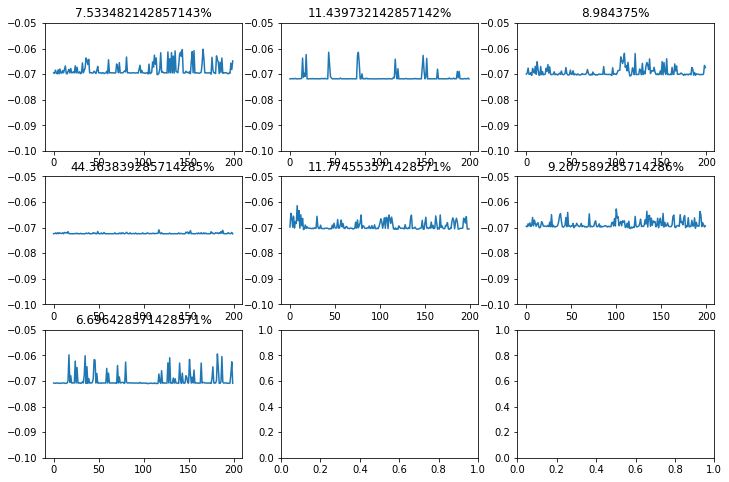

In [ ]:
analytic_signal = E.T+I.T*complex(0,1)
Leads_trained_2nd = get_leads_ts(analytic_signal, 1)



X_trained_2nd = np.array(Leads_trained_2nd)

labels_trained_2nd, centers_trained_2nd = leads_train(X_trained_2nd, 7)
labels = np.arange(200)
plot_centers(centers_trained_2nd, labels_trained_2nd, labels, 1, -0.1, 0.-0.05, 0.1)

In [ ]:
cluster = PLS_cluster(X_trained_2nd)
### decide the optimal number of clusters
cluster.get_cluster_num(threshold=.4)

[ True  True  True  True  True  True False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False Fa

[2 2 2 ... 2 2 2]


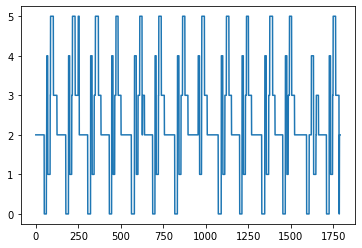

In [ ]:
# using eigvectiors to do kmean clustering
cluster.get_labels()
print(cluster.labels)
### permutation to see the cluster is random or not.. p< 0.05
"""cluster.validation(perm_n=4000)
print(cluster.p_value)"""
plt.plot(cluster.labels)

Text(0.5, 1.0, 'std_ket')

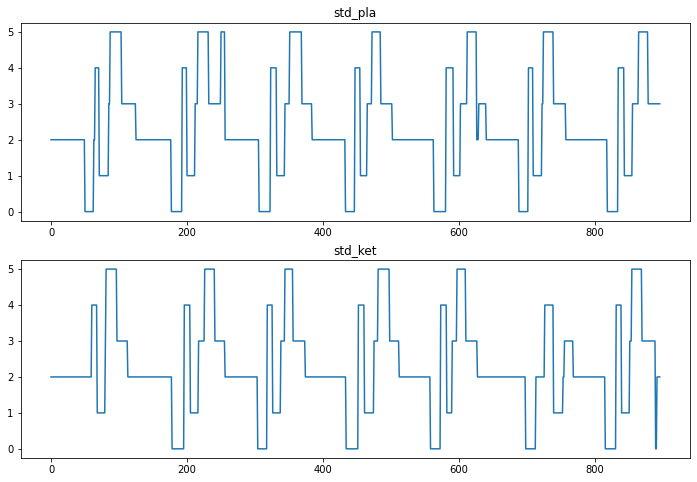

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(12,8))
ax[0].plot(cluster.labels[:len(cluster.labels)//2])
ax[0].set_title('std_pla')
ax[1].plot(cluster.labels[len(cluster.labels)//2:])
ax[1].set_title('std_ket')

In [ ]:
def get_transitionprob(labels, num_clusters):
  M =np.zeros((num_clusters,num_clusters))
  pre_labels = labels[: len(labels)-1]
  post_labels = labels[1:]
  cluster_sum = np.zeros((num_clusters,))
  for i in range(len(labels) -1):
      M[pre_labels[i], post_labels[i]] +=1
      cluster_sum[pre_labels[i]] += 1
  M = np.nan_to_num((M.T/cluster_sum).T)
  return M

In [ ]:
M_high = get_transitionprob(cluster.labels[:len(cluster.labels)//2],6)
M_low = get_transitionprob(cluster.labels[len(cluster.labels)//2:],6)

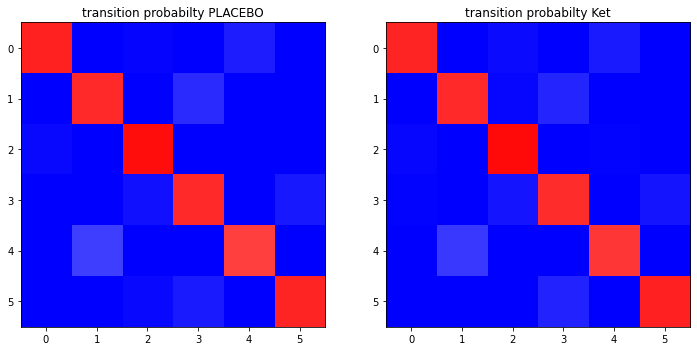

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,8))
ax[0].imshow(M_high, cmap='bwr', vmin=0, vmax=1)
ax[0].set_title('transition probabilty PLACEBO')
ax[1].imshow(M_low, cmap='bwr', vmin=0, vmax=1)
ax[1].set_title('transition probabilty Ket')
plt.show()

## Decomposition

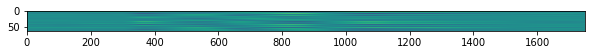

In [ ]:
xmin = -0.05
xmax = 0.3

minimum = np.where(simulated_EEG_st.times==xmin)[0][0]
maximum = np.where(simulated_EEG_st.times==xmax)[0][0]


A = simulated_EEG_st.data[:,minimum:maximum]
plt.imshow(A)
plt.show()

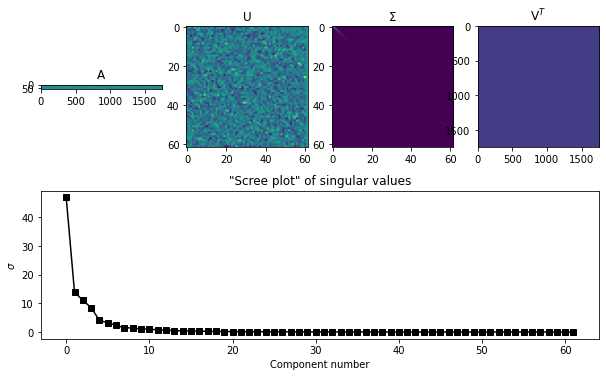

In [ ]:
# SVD (remember that V comes out transposed)
U,S,V = np.linalg.svd(A)



# show the constituent matrices
fig = plt.subplots(1,figsize=(10,6))

plt.subplot(241)
plt.imshow(A)
plt.title('A')

plt.subplot(242)
plt.imshow(U)
plt.title('U')

plt.subplot(243)
plt.imshow(np.diag(S))
plt.title('$\Sigma$')

plt.subplot(244)
plt.imshow(V)
plt.title('V$^T$')

S_PC = (100*S)/(np.sum(S))

plt.subplot(212)
plt.plot(S_PC,'ks-')
plt.xlabel('Component number')
plt.ylabel('$\sigma$')
plt.title('"Scree plot" of singular values')

plt.show()

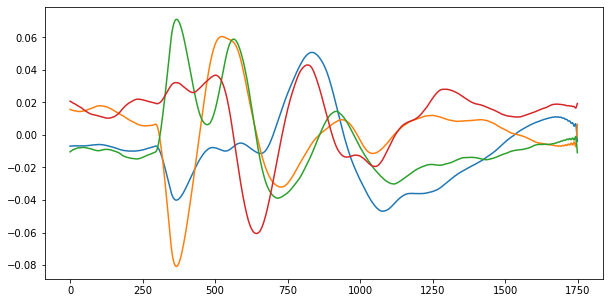

In [ ]:
plt.rcParams["figure.figsize"] = (10,5)
plt.plot(V[0,:].T)
plt.plot(V[1,:].T)
plt.plot(V[2,:].T)
plt.plot(V[3,:].T)

Text(0.5, 1.0, 'eigenvector#3 variance explained 4.03%')

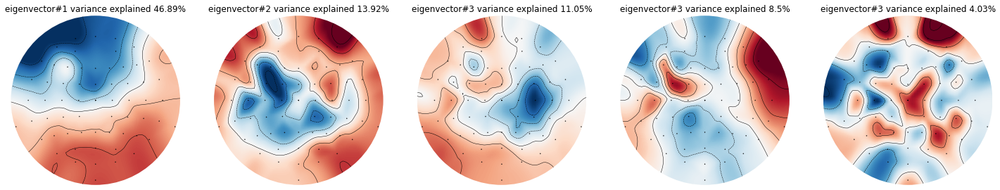

In [ ]:
fig, axes = plt.subplots(figsize=(25, 5), nrows=1, ncols=5)


mne.viz.plot_topomap(U[:, 0], simulated_EEG_st.info, show=False, axes=axes[0])
axes[0].set_title('eigenvector#' + str(1) + ' variance explained ' + str(round(S_PC[0],2)) + '%')
mne.viz.plot_topomap(U[:, 1], simulated_EEG_st.info, show=False, axes=axes[1])
axes[1].set_title('eigenvector#' + str(2) + ' variance explained ' + str(round(S_PC[1],2)) + '%')
mne.viz.plot_topomap(U[:, 2], simulated_EEG_st.info, show=False, axes=axes[2])
axes[2].set_title('eigenvector#' + str(3) + ' variance explained ' + str(round(S_PC[2],2)) + '%')
mne.viz.plot_topomap(U[:, 3], simulated_EEG_st.info, show=False, axes=axes[3])
axes[3].set_title('eigenvector#' + str(3) + ' variance explained ' + str(round(S_PC[3],2)) + '%')
mne.viz.plot_topomap(U[:, 4], simulated_EEG_st.info, show=False, axes=axes[4])
axes[4].set_title('eigenvector#' + str(3) + ' variance explained ' + str(round(S_PC[4],2)) + '%')

In [ ]:
leadfield = np.load('/content/drive/MyDrive/TORONTO/Model_DLPFC/' + sub2model + '/leadfield.npy')
U_in_source = U[0,:] @ leadfield

In [ ]:
%%capture
!pip install nilearn

In [ ]:
import nilearn.plotting as plotting
from nibabel.freesurfer import read_geometry
import matplotlib.pyplot as plt
import numpy as np
from numpy import exp,sin,cos,sqrt,pi, r_,floor,zeros
import scipy.io
from matplotlib.tri import Triangulation
from nilearn import plotting, datasets
from matplotlib import cm
from matplotlib.pyplot import subplot
import nibabel as nib

In [ ]:
def plot_surface_mpl(vtx,tri,data=None,rm=None,reorient='tvb',view='superior',
                     shaded=False,ax=None,figsize=(6,4), title=None,
                     lthr=None,uthr=None, nz_thr = 1E-20,
                     shade_kwargs = {'edgecolors': 'k', 'linewidth': 0.1,
                                     'alpha': None, 'cmap': 'coolwarm',
                                     'vmin': None, 'vmax': None}):

  r"""Plot surfaces, surface patterns, and region patterns with matplotlib

  This is a general-use function for neuroimaging surface-based data, and
  does not necessarily require construction of or interaction with tvb
  datatypes.

  See also:  plot_surface_mpl_mv



  Parameters
  ----------

  vtx           : N vertices x 3 array of surface vertex xyz coordinates

  tri           : N faces x 3 array of surface faces

  data          : array of numbers to colour surface with. Can be either
                  a pattern across surface vertices (N vertices x 1 array),
                  or a pattern across the surface's region mapping
                  (N regions x 1 array), in which case the region mapping
                  bust also be given as an argument.

  rm            : region mapping - N vertices x 1 array with (up to) N
                  regions unique values; each element specifies which
                  region the corresponding surface vertex is mapped to

  reorient      : modify the vertex coordinate frame and/or orientation
                  so that the same default rotations can subsequently be
                  used for image views. The standard coordinate frame is
                  xyz; i.e. first,second,third axis = left-right,
                  front-back, and up-down, respectively. The standard
                  starting orientation is axial view; i.e. looking down on
                  the brain in the x-y plane.

                  Options:

                    tvb (default)   : swaps the first 2 axes and applies a rotation

                    fs              : for the standard freesurfer (RAS) orientation;
                                      e.g. fsaverage lh.orig.
                                      No transformations needed for this; so is
                                      gives same result as reorient=None

  view          : specify viewing angle.

                  This can be done in one of two ways: by specifying a string
                  corresponding to a standard viewing angle, or by providing
                  a tuple or list of tuples detailing exact rotations to apply
                  around each axis.

                  Standard view options are:

                  lh_lat / lh_med / rh_lat / rh_med /
                  superior / inferior / posterior / anterior

                  (Note: if the surface contains both hemispheres, then medial
                   surfaces will not be visible, so e.g. 'rh_med' will look the
                   same as 'lh_lat')

                  Arbitrary rotations can be specied by a tuple or a list of
                  tuples, each with two elements, the first defining the axis
                  to rotate around [0,1,2], the second specifying the angle in
                  degrees. When a list is given the rotations are applied
                  sequentially in the order given.

                  Example: rotations = [(0,45),(1,-45)] applies 45 degrees
                  rotation around the first axis, followed by 45 degrees rotate
                  around the second axis.

  lthr/uthr     : lower/upper thresholds - set to zero any datapoints below /
                  above these values

  nz_thr        : near-zero threshold - set to zero all datapoints with absolute
                  values smaller than this number. Default is a very small
                  number (1E-20), which unless your data has very small numbers,
                  will only mask out actual zeros.

  shade_kwargs  : dictionary specifiying shading options

                  Most relevant options (see matplotlib 'tripcolor' for full details):

                    - 'shading'        (either 'gourand' or omit;
                                        default is 'flat')
                    - 'edgecolors'     'k' = black is probably best
                    - 'linewidth'      0.1 works well; note that the visual
                                       effect of this will depend on both the
                                       surface density and the figure size
                    - 'cmap'           colormap
                    - 'vmin'/'vmax'    scale colormap to these values
                    - 'alpha'          surface opacity

  ax            : figure axis

  figsize       : figure size (ignore if ax provided)

  title         : text string to place above figure




  Usage
  -----


  Basic freesurfer example:

  import nibabel as nib
  vtx,tri = nib.freesurfer.read_geometry('subjects/fsaverage/surf/lh.orig')
  plot_surface_mpl(vtx,tri,view='lh_lat',reorient='fs')



  Basic tvb example:

  ctx = cortex.Cortex.from_file(source_file = ctx_file,
                                region_mapping_file =rm_file)
  vtx,tri,rm = ctx.vertices,ctx.triangles,ctx.region_mapping
  conn = connectivity.Connectivity.from_file(conn_file); conn.configure()
  isrh_reg = conn.is_right_hemisphere(range(conn.number_of_regions))
  isrh_vtx = np.array([isrh_reg[r] for r in rm])
  dat = conn.tract_lengths[:,5]

  plot_surface_mpl(vtx=vtx,tri=tri,rm=rm,data=dat,view='inferior',title='inferior')

  fig, ax = plt.subplots()
  plot_surface_mpl(vtx=vtx,tri=tri,rm=rm,data=dat, view=[(0,-90),(1,55)],ax=ax,
                   title='lh angle',shade_kwargs={'shading': 'gouraud', 'cmap': 'rainbow'})


  """

  # Copy things to make sure we don't modify things
  # in the namespace inadvertently.

  vtx,tri = vtx.copy(),tri.copy()
  if data is not None: data = data.copy()

  # 1. Set the viewing angle

  if reorient == 'tvb':
    # The tvb default brain has coordinates in the order
    # yxz for some reason. So first change that:
    vtx = np.array([vtx[:,1],vtx[:,0],vtx[:,2]]).T.copy()

    # Also need to reflect in the x axis
    vtx[:,0]*=-1

  # (reorient == 'fs' is same as reorient=None; so not strictly needed
  #  but is included for clarity)



  # ...get rotations for standard view options

  if   view == 'lh_lat'    : rots =  [(0,-90),(1,90)  ]
  elif view == 'lh_med'    : rots =  [(0,-90),(1,-90) ]
  elif view == 'rh_lat'    : rots =  [(0,-90),(1,-90) ]
  elif view == 'rh_med'    : rots =  [(0,-90),(1,90)  ]
  elif view == 'superior'  : rots =   None
  elif view == 'inferior'  : rots =   (1,180)
  elif view == 'anterior'  : rots =   (0,-90)
  elif view == 'posterior' : rots =  [(0, -90),(1,180)]
  elif (type(view) == tuple) or (type(view) == list): rots = view

  # (rh_lat is the default 'view' argument because no rotations are
  #  for that one; so if no view is specified when the function is called,
  #  the 'rh_lat' option is chose here and the surface is shown 'as is'


  # ...apply rotations

  if rots is None: rotmat = np.eye(3)
  else:            rotmat = get_combined_rotation_matrix(rots)
  vtx = np.dot(vtx,rotmat)



  # 2. Sort out the data


  # ...if no data is given, plot a vector of 1s.
  #    if using region data, create corresponding surface vector
  if data is None:
    data = np.ones(vtx.shape[0])
  elif data.shape[0] != vtx.shape[0]:
    data = np.array([data[r] for r in rm])

  # ...apply thresholds
  if uthr: data *= (data < uthr)
  if lthr: data *= (data > lthr)
  data *= (np.abs(data) > nz_thr)


  # 3. Create the surface triangulation object

  x,y,z = vtx.T
  tx,ty,tz = vtx[tri].mean(axis=1).T
  tr = Triangulation(x,y,tri[np.argsort(tz)])

  # 4. Make the figure

  if ax is None: fig, ax = plt.subplots(figsize=figsize)

  #if shade = 'gouraud': shade_opts['shade'] =
  tc = ax.tripcolor(tr, np.squeeze(data), **shade_kwargs)

  ax.set_aspect('equal')
  ax.axis('off')

  if title is not None: ax.set_title(title)
  return tc
#@title function for plotting surface

In [ ]:
# @title Rotation matrix
def get_rotation_matrix(rotation_axis, deg):

  '''Return rotation matrix in the x,y,or z plane'''



  # (note make deg minus to change from anticlockwise to clockwise rotation)
  th = -deg * (pi/180) # convert degrees to radians

  if rotation_axis == 0:
    return np.array( [[    1,         0,         0    ],
                      [    0,      cos(th),   -sin(th)],
                      [    0,      sin(th),    cos(th)]])
  elif rotation_axis ==1:
    return np.array( [[   cos(th),    0,        sin(th)],
                      [    0,         1,          0    ],
                      [  -sin(th),    0,        cos(th)]])
  elif rotation_axis ==2:
    return np.array([[   cos(th),  -sin(th),     0    ],
                     [    sin(th),   cos(th),     0   ],
                     [     0,         0,          1   ]])



def get_combined_rotation_matrix(rotations):
  '''Return a combined rotation matrix from a dictionary of rotations around
     the x,y,or z axes'''
  rotmat = np.eye(3)

  if type(rotations) is tuple: rotations = [rotations]
  for r in rotations:
    newrot = get_rotation_matrix(r[0],r[1])
    rotmat = np.dot(rotmat,newrot)
  return rotmat

In [ ]:
def plot_surface_mpl_mv(vtx=None,tri=None,data=None,rm=None,hemi=None,   # Option 1
                        vtx_lh=None,tri_lh=None,data_lh=None,rm_lh=None, # Option 2
                        vtx_rh=None,tri_rh=None,data_rh=None,rm_rh=None,
                        title=None,**kwargs):

  r"""Convenience wrapper on plot_surface_mpl for multiple views

  This function calls plot_surface_mpl five times to give a complete
  picture of a surface- or region-based spatial pattern.

  As with plot_surface_mpl, this function is written so as to be
  generally usable with neuroimaging surface-based data, and does not
  require construction of of interaction with tvb datatype objects.

  In order for the medial surfaces to be displayed properly, it is
  necessary to separate the left and right hemispheres. This can be
  done in one of two ways:

  1. Provide single arrays for vertices, faces, data, and
     region mappings, and addition provide arrays of indices for
     each of these (vtx_inds,tr_inds,rm_inds) with 0/False
     indicating left hemisphere vertices/faces/regions, and 1/True
     indicating right hemisphere.

     Note: this requires that

  2. Provide separate vertices,faces,data,and region mappings for
     each hemisphere (vtx_lh,tri_lh; vtx_rh,tri_rh,etc...)



  Parameters
  ----------

  (see also plot_surface_mpl parameters info for more details)

  (Option 1)

  vtx               :  surface vertices

  tri               : surface faces

  data              : spatial pattern to plot

  rm                : surface vertex to region mapping

  hemi              : hemisphere labels for each vertex
                      (1/True = right, 0/False = left) -


  OR

  (Option 2)

  vtx_lh            : left hemisphere surface_vertices
  vtx_rh            : right ``      ``    ``     ``

  tri_lh            : left hemisphere surface faces
  tri_rh            : right ``      ``    ``     ``

  data_lh          : left hemisphere surface_vertices
  data_rh          : right ``      ``    ``     ``

  rm_lh            : left hemisphere region_mapping
  rm_rh            : right ``      ``    ``     ``


  title            : title to show above middle plot

  kwargs           : additional tripcolor kwargs; see plot_surface_mpl



  Examples
  ----------

  # TVB default data

  # Plot one column of the region-based tract lengths
  # connectivity matrix. The corresponding region is
  # right auditory cortex ('rA1')

  ctx = cortex.Cortex.from_file(source_file = ctx_file,
                                region_mapping_file =rm_file)
  vtx,tri,rm = ctx.vertices,ctx.triangles,ctx.region_mapping
  conn = connectivity.Connectivity.from_file(conn_file); conn.configure()
  isrh_reg = conn.is_right_hemisphere(range(conn.number_of_regions))
  isrh_vtx = np.array([isrh_reg[r] for r in rm])
  dat = conn.tract_lengths[:,5]

  plot_surface_mpl_mv(vtx=vtx,tri=tri,rm=rm,data=dat,
                      hemi=isrh_vtx,title=u'rA1 \ntract length')

  plot_surface_mpl_mv(vtx=vtx,tri=tri,rm=rm,data=dat,
                    hemi=isrh_vtx,title=u'rA1 \ntract length',
                    shade_kwargs = {'shading': 'gouraud',
                                    'cmap': 'rainbow'})


  """



  if vtx is not None:                                    # Option 1
    tri_hemi = hemi[tri].any(axis=1)
    tri_lh,tri_rh = tri[tri_hemi==0],tri[tri_hemi==1]
  elif vtx_lh is not None:                               # Option 2
    vtx = np.vstack([vtx_lh,vtx_rh])
    tri = np.vstack([tri_lh,tri_rh+tri_lh.max()+1])

  if data_lh is not None:                                # Option 2
    data = np.hstack([data_lh,data_rh])

  if rm_lh is not None:                                  # Option 2
    rm = np.hstack([rm_lh,rm_rh + rm_lh.max() + 1])



  # 2. Now do the plots for each view

  # (Note: for the single hemispheres we only need lh/rh arrays for the
  #  faces (tri); the full vertices, region mapping, and data arrays
  #  can be given as arguments, they just won't be shown if they aren't
  #  connected by the faces in tri )
  fig, ax = plt.subplots(2,3, figsize=(15,10))
  # LH lateral
  plot_surface_mpl(vtx,tri_lh,data=data,rm=rm,view='lh_lat',
                   ax=subplot(2,3,1),**kwargs)

  # LH medial
  plot_surface_mpl(vtx,tri_lh, data=data,rm=rm,view='lh_med',
                   ax=subplot(2,3,4),**kwargs)

  # RH lateral
  plot_surface_mpl(vtx,tri_rh, data=data,rm=rm,view='rh_lat',
                   ax=subplot(2,3,3),**kwargs)

  # RH medial
  plot_surface_mpl(vtx,tri_rh, data=data,rm=rm,view='rh_med',
                   ax=subplot(2,3,6),**kwargs)

  # Both superior
  im =plot_surface_mpl(vtx,tri, data=data,rm=rm,view='superior',
                   ax=subplot(1,3,2),title=title,**kwargs)

  plt.subplots_adjust(left=0.0, right=.8, bottom=0.0,
                      top=.8, wspace=0, hspace=0)
  cbar_ax = fig.add_axes([0.85,0.1,0.05,0.6])
  fig.colorbar(im, cax = cbar_ax)

  #@title function for plot brain in one picture

In [ ]:
lh_annot = nib.freesurfer.io.read_annot('/content/drive/MyDrive/TORONTO/EEG/fsaverage/label/lh.Schaefer2018_200Parcels_7Networks_order.annot')[0]
rh_annot = nib.freesurfer.io.read_annot('/content/drive/MyDrive/TORONTO/EEG/fsaverage/label//rh.Schaefer2018_200Parcels_7Networks_order.annot')[0]

rh_annot_nl = rh_annot+np.max(rh_annot)
rh_annot_nl[rh_annot_nl == 100] = 0
reg_map = np.concatenate([lh_annot, rh_annot_nl])
hemi = np.ones_like(reg_map)

hemi[:reg_map.shape[0]//2] = 0

lhp_vtx_new,lhp_tri_new = nib.freesurfer.read_geometry('/content/drive/MyDrive/TORONTO/EEG/fsaverage/surf/both.pial')


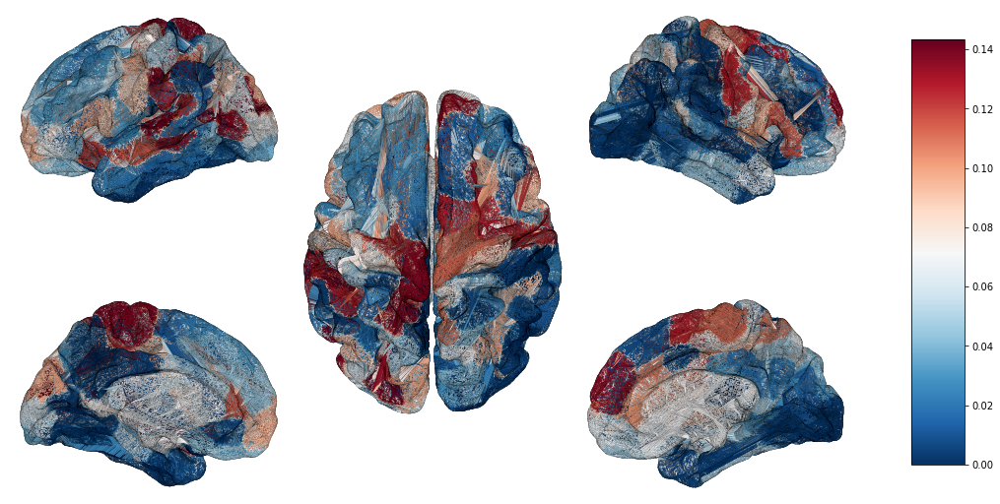

In [ ]:
# PLOT FOR output weights of Behav at E
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': 0.1,'vmin': -0.1, 'alpha': None, 'linewidth': 0.05}
data_pos = centers_trained_2nd[0]-centers_trained_2nd[0].min()
data = np.concatenate([0.5*data_pos.max()*np.ones((1)),data_pos])[reg_map]

kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': data_pos.max(),'vmin': 0, 'alpha': None, 'linewidth': 0.05}
plot_surface_mpl_mv(vtx=lhp_vtx_new, tri=lhp_tri_new, data=data, reorient='fs', hemi=hemi, rm=reg_map, shade_kwargs=kws)

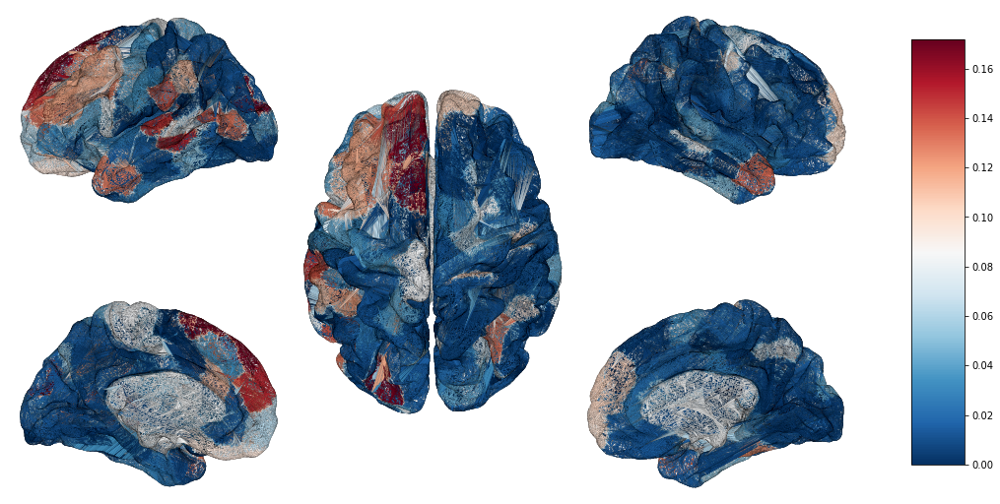

In [ ]:
# PLOT FOR output weights of Behav at E
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': 0.1,'vmin': -0.1, 'alpha': None, 'linewidth': 0.05}
data_pos = centers_trained_2nd[1]-centers_trained_2nd[1].min()
data = np.concatenate([0.5*data_pos.max()*np.ones((1)),data_pos])[reg_map]

kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': data_pos.max(),'vmin': 0, 'alpha': None, 'linewidth': 0.05}
plot_surface_mpl_mv(vtx=lhp_vtx_new, tri=lhp_tri_new, data=data, reorient='fs', hemi=hemi, rm=reg_map, shade_kwargs=kws)

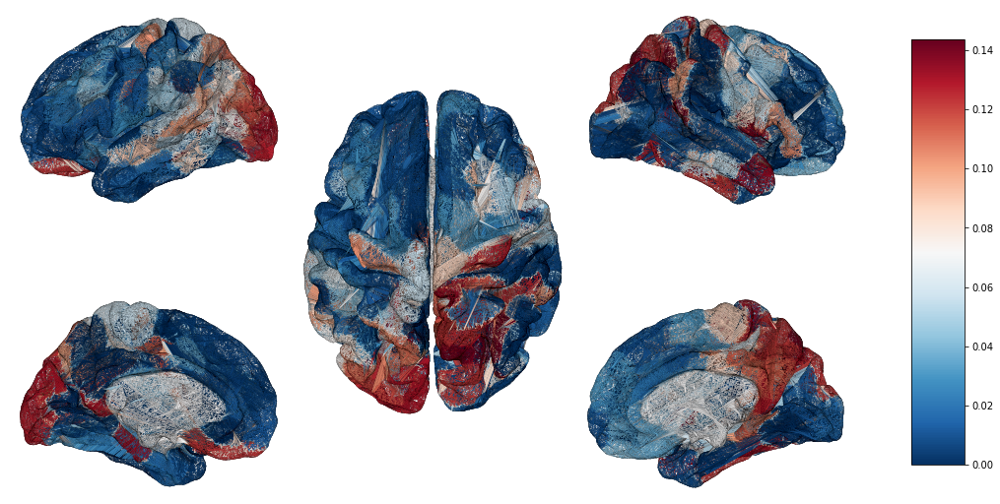

In [ ]:
# PLOT FOR output weights of Behav at E
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': 0.1,'vmin': -0.1, 'alpha': None, 'linewidth': 0.05}
data_pos = centers_trained_2nd[2]-centers_trained_2nd[2].min()
data = np.concatenate([0.5*data_pos.max()*np.ones((1)),data_pos])[reg_map]

kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': data_pos.max(),'vmin': 0, 'alpha': None, 'linewidth': 0.05}
plot_surface_mpl_mv(vtx=lhp_vtx_new, tri=lhp_tri_new, data=data, reorient='fs', hemi=hemi, rm=reg_map, shade_kwargs=kws)

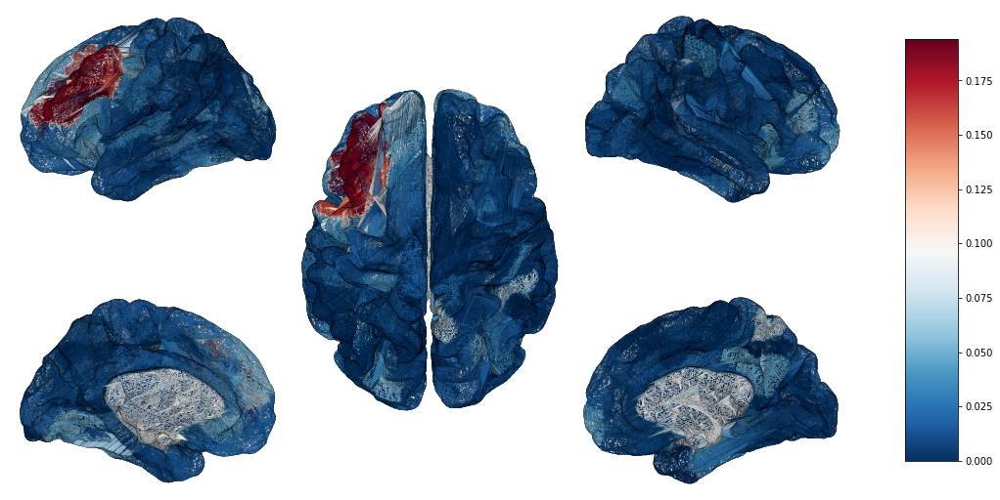

In [ ]:
# PLOT FOR output weights of Behav at E
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': 0.1,'vmin': -0.1, 'alpha': None, 'linewidth': 0.05}
data_pos = centers_trained_2nd[3]-centers_trained_2nd[3].min()
data = np.concatenate([0.5*data_pos.max()*np.ones((1)),data_pos])[reg_map]

kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': data_pos.max(),'vmin': 0, 'alpha': None, 'linewidth': 0.05}
plot_surface_mpl_mv(vtx=lhp_vtx_new, tri=lhp_tri_new, data=data, reorient='fs', hemi=hemi, rm=reg_map, shade_kwargs=kws)

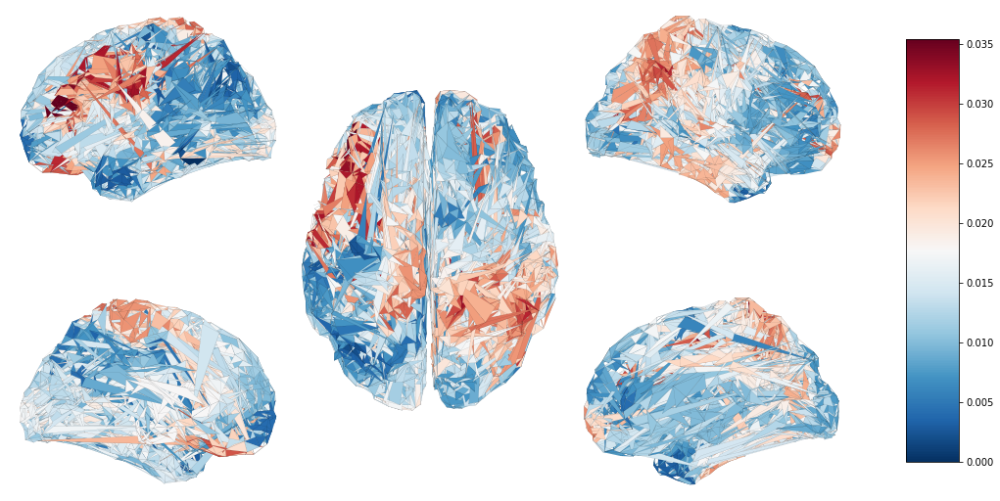

In [ ]:
import os.path as op
lh_regmap = nib.freesurfer.io.read_annot('/content/drive/MyDrive/TORONTO/EEG/fsaverage/label/lh.Schaefer2018_200Parcels_7Networks_order.annot')[0]
rh_regmap = nib.freesurfer.io.read_annot('/content/drive/MyDrive/TORONTO/EEG/fsaverage/label//rh.Schaefer2018_200Parcels_7Networks_order.annot')[0]
regmap = np.concatenate([lh_regmap, rh_regmap+np.max(lh_regmap)-1])

from scipy.spatial import cKDTree


all_vtx,all_tri = nib.freesurfer.read_geometry('/content/drive/MyDrive/TORONTO/EEG/fsaverage/surf/both.pial')

vtx_decimated, tri_decimated  = nib.freesurfer.io.read_geometry('/content/drive/MyDrive/TORONTO/EEG/fsaverage/surf/both_decimate')
vtx_subset_idxs_decimated = cKDTree(all_vtx).query(vtx_decimated)[1]
isrh_reg = np.full(int(200/2), True, dtype=bool)
islh_reg = np.full(int(200/2), False, dtype=bool)
isrh_reg = np.concatenate((islh_reg, isrh_reg))

regmap_decimated = regmap[vtx_subset_idxs_decimated]
isrh_vtx_decimated = np.array([isrh_reg[r] for r in regmap_decimated])

hemi = np.ones_like(regmap_decimated)
hemi[:regmap_decimated.shape[0]//2] = 0


data_pos = centers_trained_2nd[0]-centers_trained_2nd[0].min()
data = np.concatenate([0.5*data_pos.max()*np.ones((1)),data_pos])[regmap_decimated]

kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet',
       'vmax': data_pos.max(),'vmin': 0, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_decimated, tri=tri_decimated, data=data, reorient='fs', hemi=hemi, rm=data, shade_kwargs=kws)


In [ ]:
epoched = mne.read_epochs(eeg_file, verbose=False)
data2use = epoched._data
data2use = np.swapaxes(data2use,1,2)
data2use = np.swapaxes(data2use,0,2)
data2use.shape

(62, 7500, 70)

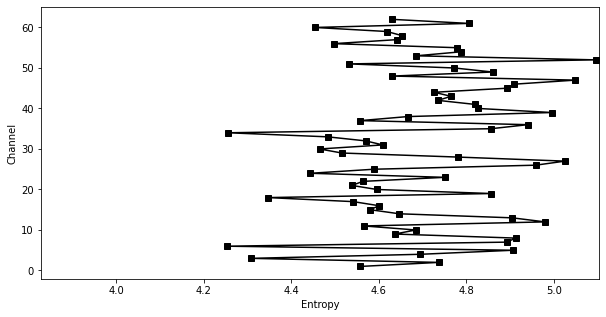

In [ ]:
# sizes of the dimensions (chan X time X repetitions)
csdsize = np.shape(data2use)

# compute event-related potential (averaging)
erp = np.mean(data2use,2)


# crucial parameter -- number of bins!
nbins = 50


# initialize entropy matrix
entro = np.zeros(csdsize[0])

# compute entropy for each channel
for chani in range(0,csdsize[0]):

    # find boundaries
    edges = np.linspace(np.min(erp[chani,:]),np.max(erp[chani,:]),nbins)

    # bin the data
    nPerBin,bins = np.histogram(erp[chani,:],edges)

    # convert to probability
    probs = nPerBin / np.sum(nPerBin)

    # compute entropy
    entro[chani] = -np.sum( probs*np.log2(probs+np.finfo(float).eps) )


# plot
plt.plot(entro,np.arange(1,csdsize[0]+1),'ks-')
plt.xlim([np.min(entro)*.9, np.min(entro)*1.2])
plt.xlabel('Entropy')
plt.ylabel('Channel')
plt.show()

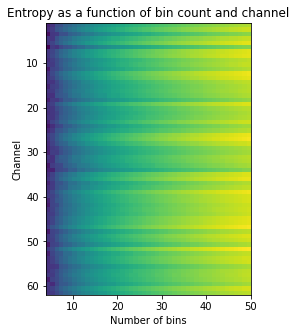

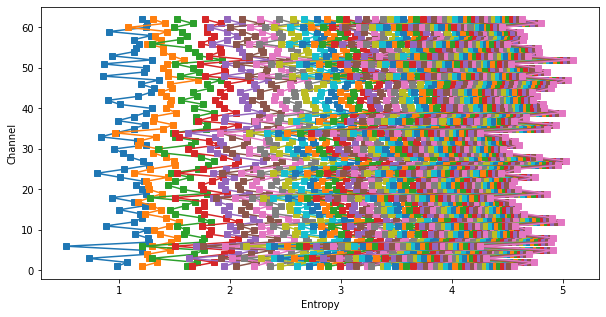

In [ ]:
## loop over bin count

# variable number of bins!
nbins = np.arange(4,51)

# initialize
entro = np.zeros((np.shape(erp)[0],len(nbins)))

for bini in range(len(nbins)):

    # compute entropy as above
    for chani in range(np.shape(erp)[0]):
        edges = np.linspace(np.min(erp[chani,:]),np.max(erp[chani,:]),nbins[bini])
        nPerBin,bins = np.histogram(erp[chani,:],edges)
        probs = nPerBin / np.sum(nPerBin)
        entro[chani,bini] = -np.sum( probs*np.log2(probs+np.finfo(float).eps) )


plt.imshow(entro, extent=[4,50,csdsize[0],1])
plt.xlabel('Number of bins')
plt.ylabel('Channel')
plt.title('Entropy as a function of bin count and channel')
plt.show()


plt.plot(entro,np.arange(1,csdsize[0]+1),'s-')
plt.xlabel('Entropy')
plt.ylabel('Channel')
plt.show()

In [ ]:
csdsize = np.shape(data2use)

# crucial parameter -- number of bins!
nbins = 50



# initialize entropy matrix
entro_baseline = np.zeros((csdsize[0], csdsize[2]))

for  trial2use in range(data2use.shape[2]):
# compute event-related potential (averaging)
  erp = data2use[:,500:1500,trial2use]




  # compute entropy for each channel
  for chani in range(0,csdsize[0]):

      # find boundaries
      edges = np.linspace(np.min(erp[chani,:]),np.max(erp[chani,:]),nbins)

      # bin the data
      nPerBin,bins = np.histogram(erp[chani,:],edges)

      # convert to probability
      probs = nPerBin / np.sum(nPerBin)

      # compute entropy
      entro_baseline[chani, trial2use] = -np.sum( probs*np.log2(probs+np.finfo(float).eps) )



# initialize entropy matrix
entro_tms = np.zeros((csdsize[0], csdsize[2]))

for  trial2use in range(data2use.shape[2]):
# compute event-related potential (averaging)
  erp = data2use[:,2500:3500,trial2use]




  # compute entropy for each channel
  for chani in range(0,csdsize[0]):

      # find boundaries
      edges = np.linspace(np.min(erp[chani,:]),np.max(erp[chani,:]),nbins)

      # bin the data
      nPerBin,bins = np.histogram(erp[chani,:],edges)

      # convert to probability
      probs = nPerBin / np.sum(nPerBin)

      # compute entropy
      entro_tms[chani, trial2use] = -np.sum( probs*np.log2(probs+np.finfo(float).eps) )

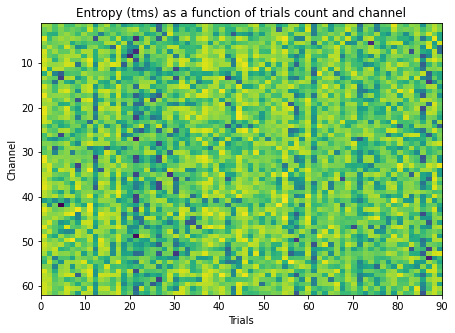

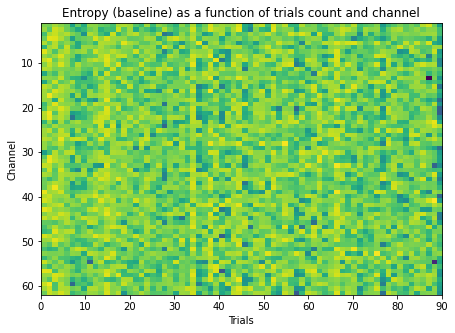

In [ ]:
plt.imshow(entro_tms, extent=[0,90,csdsize[0],1])
plt.xlabel('Trials')
plt.ylabel('Channel')
plt.title('Entropy (tms) as a function of trials count and channel')
plt.show()


plt.imshow(entro_baseline, extent=[0,90,csdsize[0],1])
plt.xlabel('Trials')
plt.ylabel('Channel')
plt.title('Entropy (baseline) as a function of trials count and channel')
plt.show()


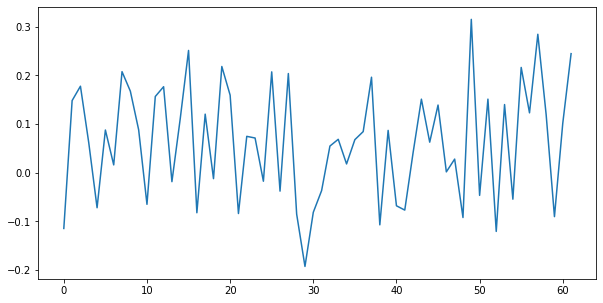

In [ ]:
corr_mat = np.zeros((entro_tms.shape[0]))

for ch in range(entro_tms.shape[0]):
  corr_mat[ch] = np.corrcoef(entro_baseline[ch,:], entro_tms[ch,:])[0,1]


plt.plot(corr_mat)

In [ ]:
trial_above = np.where(np.mean(entro_baseline, axis=0)> np.mean(np.mean(entro_baseline, axis=0)) + (np.std(np.mean(entro_baseline, axis=0))))
trial_below = np.where(np.mean(entro_baseline, axis=0) < np.mean(np.mean(entro_baseline, axis=0)) + (np.std(np.mean(entro_baseline, axis=0))))

No projector specified for this dataset. Please consider the method self.add_proj.


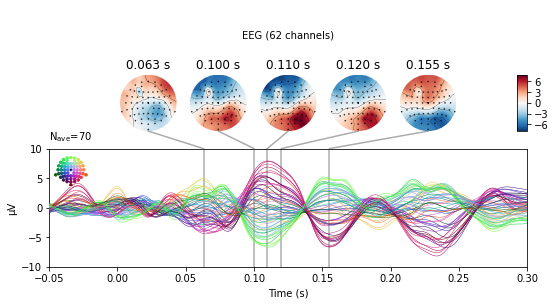

In [ ]:
epoched = mne.read_epochs(eeg_file, verbose=False)
evoked = epoched.average()
evoked.data = np.mean(np.squeeze(epoched._data[trial_above,:,:]), axis=0)

ymin = -10
ymax = 10

ts_args = dict(xlim=[-0.05,0.3], ylim=dict(eeg=[ymin, ymax]))

ch, peak_locs1 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.07)
ch, peak_locs2 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.1)
ch, peak_locs3 = evoked.get_peak(ch_type='eeg', tmin=0.1, tmax=0.12)
ch, peak_locs4 = evoked.get_peak(ch_type='eeg', tmin=0.12, tmax=0.15)
ch, peak_locs5 = evoked.get_peak(ch_type='eeg', tmin=0.15, tmax=0.20)

times = [peak_locs1, peak_locs2, peak_locs3, peak_locs4, peak_locs5]


plot = evoked.plot_joint(ts_args=ts_args, times=times);

No projector specified for this dataset. Please consider the method self.add_proj.


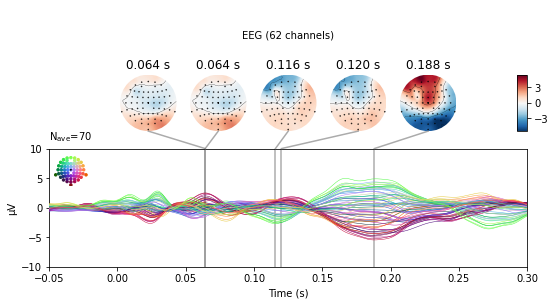

In [ ]:
epoched = mne.read_epochs(eeg_file, verbose=False)
evoked = epoched.average()
evoked.data = np.mean(np.squeeze(epoched._data[trial_below,:,:]), axis=0)


ch, peak_locs1 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.07)
ch, peak_locs2 = evoked.get_peak(ch_type='eeg', tmin=0.05, tmax=0.1)
ch, peak_locs3 = evoked.get_peak(ch_type='eeg', tmin=0.1, tmax=0.12)
ch, peak_locs4 = evoked.get_peak(ch_type='eeg', tmin=0.12, tmax=0.15)
ch, peak_locs5 = evoked.get_peak(ch_type='eeg', tmin=0.15, tmax=0.20)

times = [peak_locs1, peak_locs2, peak_locs3, peak_locs4, peak_locs5]

ymin = -10
ymax = 10

ts_args = dict(xlim=[-0.05,0.3], ylim=dict(eeg=[ymin, ymax]))

plot = evoked.plot_joint(ts_args=ts_args, times=times);

(16, 62, 7500)

In [ ]:
epoched._data[trial_above,:,:].shape

(1, 16, 62, 7500)

In [ ]:
src = mne.read_source_spaces('/content/drive/MyDrive/TORONTO/TMS_EEG_model/fsaverage/fsaverage-src', verbose=False)

In [ ]:
subjects_dir = '/content/drive/MyDrive/TORONTO/TMS_EEG_model/'
subject = 'fsaverage'
os.environ['SUBJECTS_DIR'] = subjects_dir
schaefer = mne.read_labels_from_annot(subject, 'Schaefer2018_200Parcels_7Networks_order')

Reading labels from parcellation...
   read 101 labels from /content/drive/MyDrive/TORONTO/TMS_EEG_model/fsaverage/label/lh.Schaefer2018_200Parcels_7Networks_order.annot
   read 101 labels from /content/drive/MyDrive/TORONTO/TMS_EEG_model/fsaverage/label/rh.Schaefer2018_200Parcels_7Networks_order.annot


In [ ]:
M1_source = mne.read_source_estimate('/content/drive/MyDrive/TORONTO/EEG/all_sbj_sources/all_real_sbj_sources/sub001/stc')

In [ ]:
from nibabel import freesurfer as nfs

pathToAnnotationRh = '/content/drive/MyDrive/TORONTO/TMS_EEG_model/fsaverage/label/rh.Schaefer2018_200Parcels_7Networks_order.annot'
pathToAnnotationLh = '/content/drive/MyDrive/TORONTO/TMS_EEG_model/fsaverage/label/lh.Schaefer2018_200Parcels_7Networks_order.annot'

lh = nfs.read_annot(pathToAnnotationLh)
rh = nfs.read_annot(pathToAnnotationRh)

parcellation = np.zeros((src[0]['vertno'].shape[0] + src[1]['vertno'].shape[0]))

finder = []
for vertex in range(src[0]['vertno'].shape[0]):
  if lh[0][src[0]['vertno'][vertex]] == 0:
    finder.append(vertex)
  parcellation[vertex] = lh[0][src[0]['vertno'][vertex]]


#for vertex in range(src[1]['vertno'].shape[0]):
#  parcellation[vertex+src[0]['vertno'].shape[0]] = rh[0][src[1]['vertno'][vertex]] + 100

In [ ]:
forward = mne.read_forward_solution('/content/drive/MyDrive/TORONTO/EEG/all_sbj_sources/all_real_sbj_sources/sub001/fwd', verbose=False)

<ipython-input-18-a198b976f78d>:1: RuntimeWarning: This filename (/content/drive/MyDrive/TORONTO/EEG/all_sbj_sources/all_real_sbj_sources/sub001/fwd) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif or _fwd.fif.gz
  forward = mne.read_forward_solution('/content/drive/MyDrive/TORONTO/EEG/all_sbj_sources/all_real_sbj_sources/sub001/fwd', verbose=False)


In [ ]:
leadfield = forward['sol']['data']
fwd_fixed = mne.convert_forward_solution(forward, surf_ori=True, force_fixed=True,
                                         use_cps=True)
leadfield = fwd_fixed['sol']['data']


    Average patch normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]


In [ ]:
parcellation = np.zeros((src[0]['vertno'].shape[0] + src[1]['vertno'].shape[0]))

for label in range(1,101):
  common_idx = np.intersect1d(src[0]['vertno'], schaefer[label].vertices)
  for xx in range(common_idx.shape[0]):
    source_idx = np.where(src[0]['vertno'] == common_idx[xx])[0][0]
    parcellation[source_idx] = int(label)


for label in range(101,201):
  common_idx = np.intersect1d(src[1]['vertno'], schaefer[label].vertices)
  for xx in range(common_idx.shape[0]):
    source_idx = np.where(src[1]['vertno'] == common_idx[xx])[0][0]
    parcellation[source_idx + src[0]['vertno'].shape[0]] = int(label)

In [ ]:
leadfield = np.delete(leadfield, np.where(parcellation==0)[0], axis=1)
source_intensities = np.delete(M1_source.data, np.where(parcellation==0)[0], axis=0)
parcellation = np.delete(parcellation, np.where(parcellation==0)[0])
eeg_data = np.dot(leadfield, source_intensities)


In [ ]:
eeg_verb_data = (data_verb*1.5e13)[:,:2000]
eeg_noise_data = (data_noise*1.5e13)[:,:2000]

In [ ]:
eeg_verb_data.T.shape

(2000, 274)

In [ ]:
data_mean = dataloader(eeg_verb_data.T, num_epoches, batch_size)
data_mean.shape
F_verb.ts=data_mean
#fit data(train)
u = np.zeros((node_size,hidden_size,2000))
#u[:,:,120:130,0]= 00
u[:,:,620:630]= 2000
#u[:,:,0:1, 2]= 0
#u[:,:,100:21,1]= 70





output_test = F_verb.test(50, u=u)

0.9055942875685663 cos_sim:  0.18025022861791407


In [ ]:
data_mean = dataloader(eeg_noise_data.T, num_epoches, batch_size)
data_mean.shape
F_noise.ts=data_mean
#fit data(train)
u = np.zeros((node_size,hidden_size,2000))
#u[:,:,120:130,0]= 00
u[:,:,620:630]= 2000
#u[:,:,0:1, 2]= 0
#u[:,:,100:21,1]= 70





output_test = F_noise.test(50, u=u)

0.8541393013655806 cos_sim:  0.12077708252025274


In [ ]:
url = 'https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Centroid_coordinates/Schaefer2018_200Parcels_7Networks_order_FSLMNI152_2mm.Centroid_RAS.csv'
labels = pd.read_csv(url)
labels = labels['ROI Name']

In [ ]:
networks = [label.split('_')[2] for label in labels]
network_name = set(networks)
network_activity_verb = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_verb[net] = (F_verb.output_sim.P_test[ind]).mean(0)

network_activity_verb_df = pd.DataFrame(network_activity_verb)

network_activity_noise = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_noise[net] = (F_noise.output_sim.P_test[ind]).mean(0)

network_activity_noise_df = pd.DataFrame(network_activity_noise)

In [ ]:
networks = [label.split('_')[2] for label in labels]
network_name = set(networks)
network_activity_verb = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_verb[net] = (F_verb.output_sim.E_test[ind]).mean(0)

network_activity_verb_E_df = pd.DataFrame(network_activity_verb)

network_activity_noise = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_noise[net] = (F_noise.output_sim.E_test[ind]).mean(0)

network_activity_noise_E_df = pd.DataFrame(network_activity_noise)

In [ ]:
networks = [label.split('_')[2] for label in labels]
network_name = set(networks)
network_activity_verb = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_verb[net] = (F_verb.output_sim.I_test[ind]).mean(0)

network_activity_verb_I_df = pd.DataFrame(network_activity_verb)

network_activity_noise = {}
for net in network_name:
    ind = np.arange(200)[np.array(networks) == net]
    network_activity_noise[net] = (F_noise.output_sim.I_test[ind]).mean(0)

network_activity_noise_I_df = pd.DataFrame(network_activity_noise)

(-0.05, 0.4)

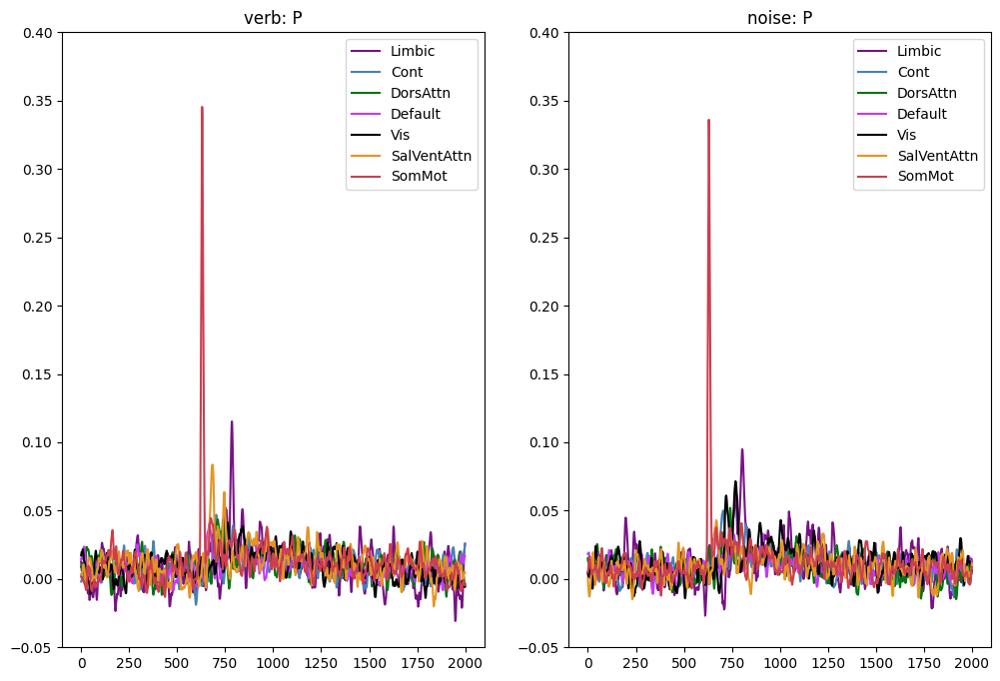

In [ ]:
colors = ["#781286","#4682B4","#00760E","#C43AFA","#000000","#E69422","#CD3E4E"]
fig, ax = plt.subplots(1,2, figsize=(12,8))
network_activity_verb_df.plot(color = colors, ax=ax[0])
ax[0].set_title('verb: P')
ax[0].set_ylim(-0.05,0.4)
network_activity_noise_df.plot(color = colors, ax=ax[1])
ax[1].set_title('noise: P')
ax[1].set_ylim(-0.05,0.4)

(1.0, 6.0)

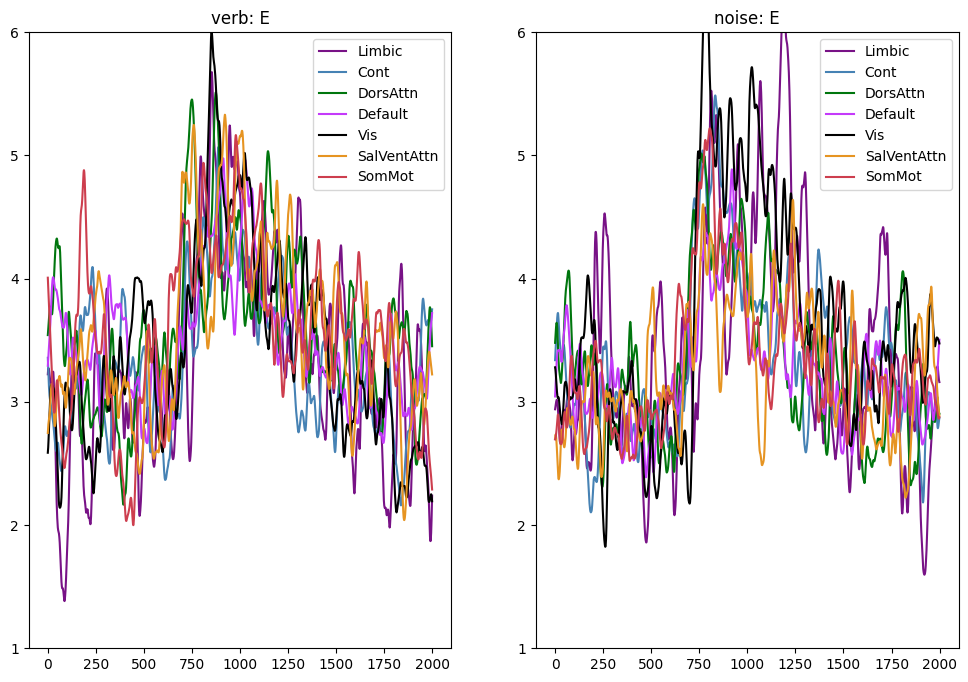

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,8))
network_activity_verb_E_df.plot(color = colors, ax=ax[0])
ax[0].set_title('verb: E')
ax[0].set_ylim(1,6)
network_activity_noise_E_df.plot(color = colors, ax=ax[1])
ax[1].set_title('noise: E')
ax[1].set_ylim(1,6)

(1.0, 6.5)

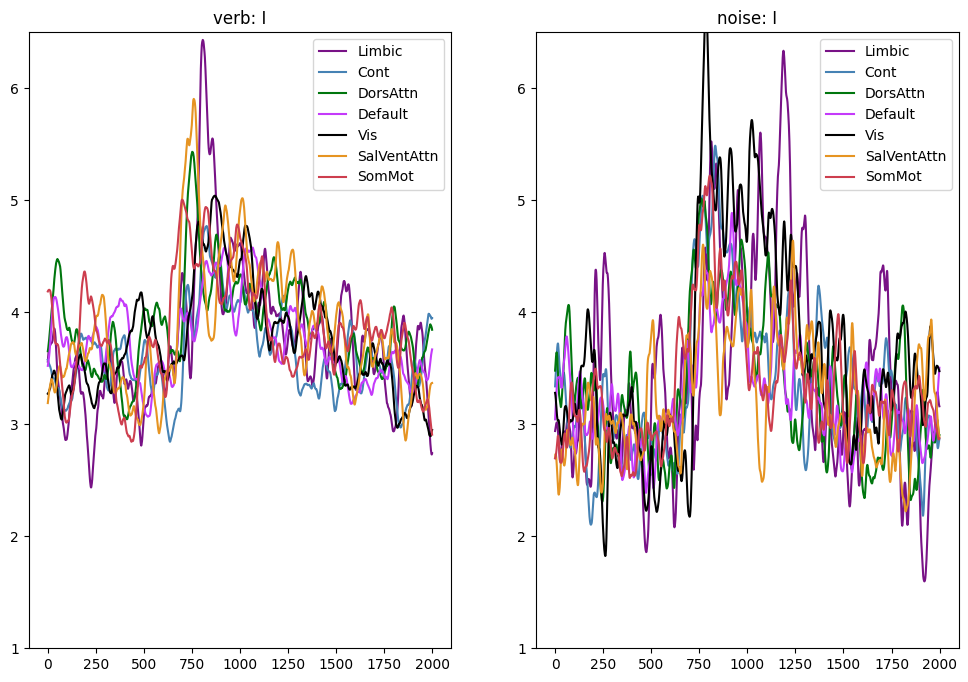

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,8))
network_activity_verb_I_df.plot(color = colors, ax=ax[0])
ax[0].set_title('verb: I')
ax[0].set_ylim(1,6.5)
network_activity_noise_E_df.plot(color = colors, ax=ax[1])
ax[1].set_title('noise: I')
ax[1].set_ylim(1,6.5)

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


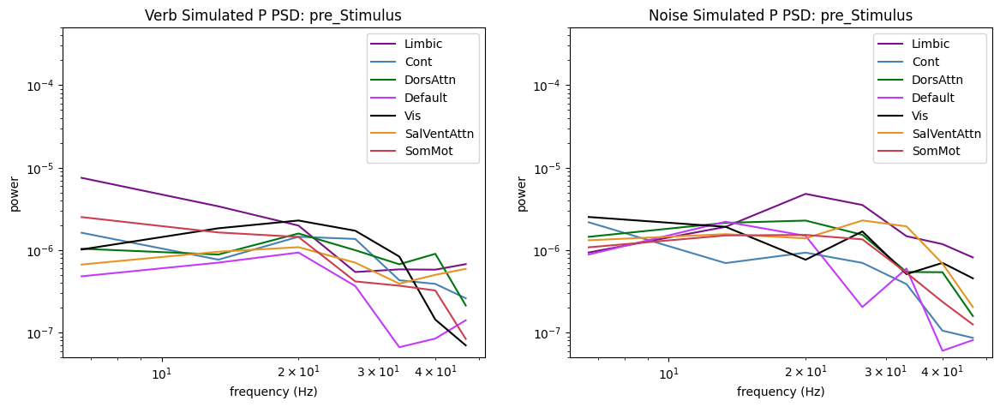

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_df[0:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated P PSD: pre_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-8,5e-4)
t_net = network_activity_noise_df[:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated P PSD: pre_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-8,5e-4)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


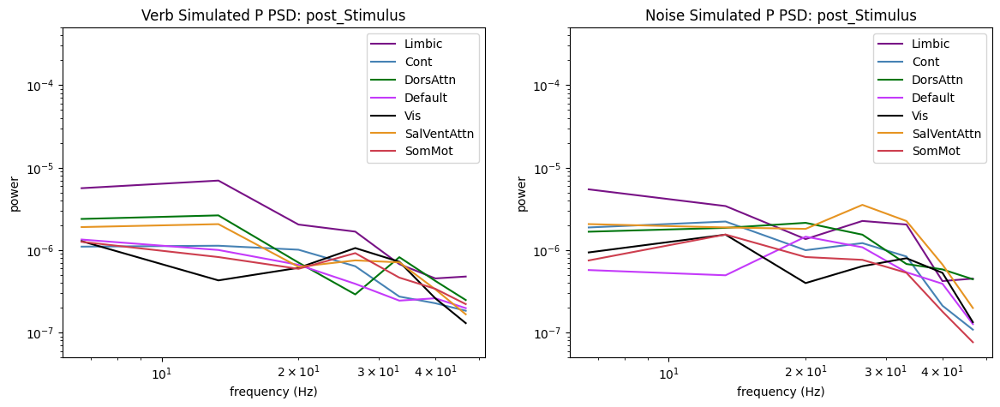

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated P PSD: post_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-8,5e-4)
t_net = network_activity_noise_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated P PSD: post_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-8,5e-4)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


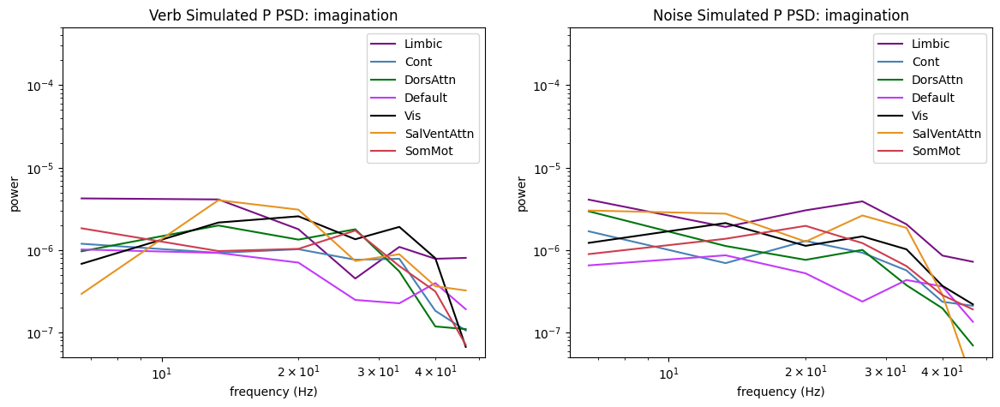

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated P PSD: imagination')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-8,5e-4)
t_net = network_activity_noise_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated P PSD: imagination')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-8,5e-4)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


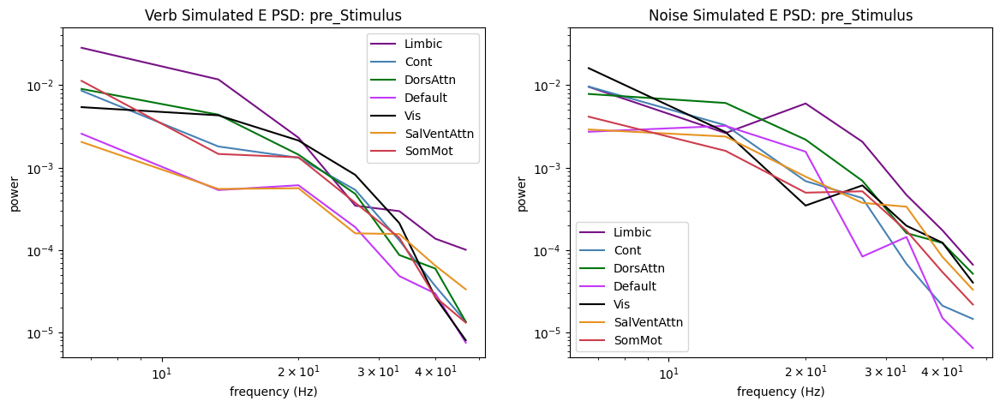

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_E_df[0:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated E PSD: pre_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-6,5e-2)
t_net = network_activity_noise_E_df[:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated E PSD: pre_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-6,5e-2)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


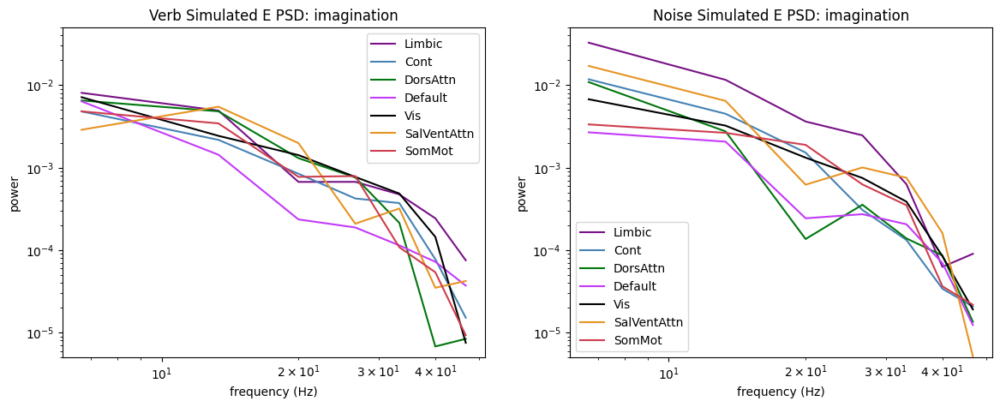

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_E_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated E PSD: imagination')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-6,5e-2)
t_net = network_activity_noise_E_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated E PSD: imagination')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-6,5e-2)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


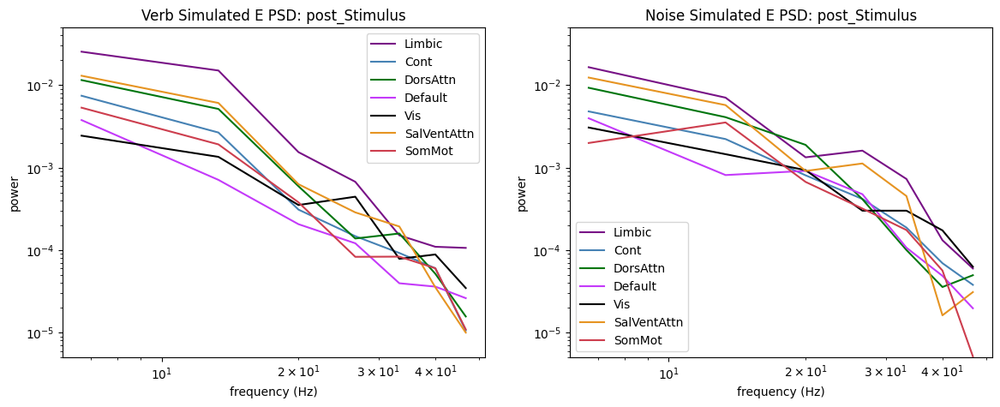

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_E_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated E PSD: post_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-6,5e-2)
t_net = network_activity_noise_E_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated E PSD: post_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-6,5e-2)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


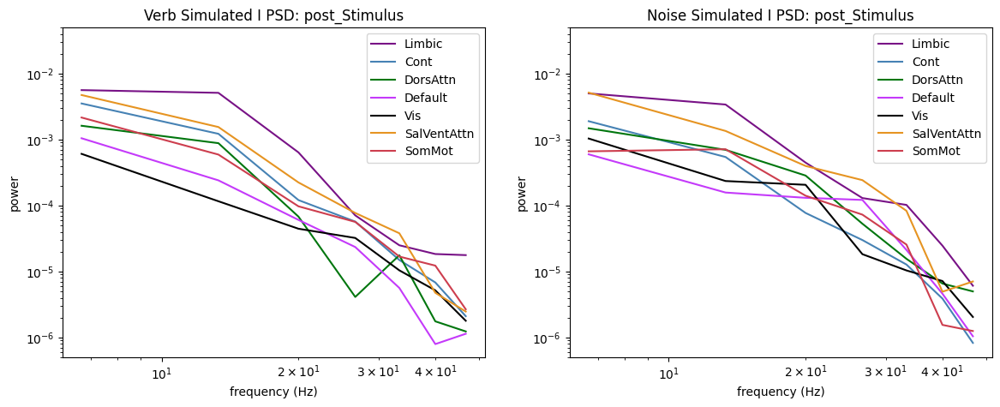

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_I_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated I PSD: post_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-7,5e-2)
t_net = network_activity_noise_I_df[1500:].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated I PSD: post_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-7,5e-2)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


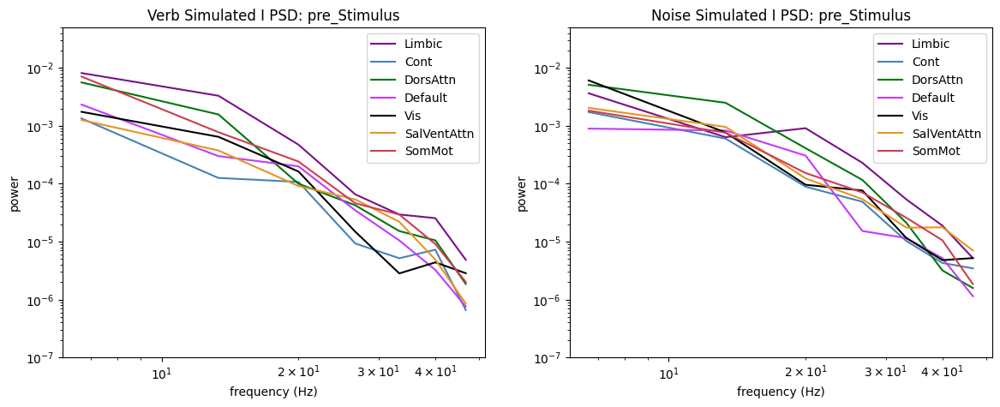

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_I_df[0:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated I PSD: pre_Stimulus')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(1e-7,5e-2)
t_net = network_activity_noise_I_df[:500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated I PSD: pre_Stimulus')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(1e-7,5e-2)
plt.show()

Effective window size : 0.150 (s)
Effective window size : 0.150 (s)


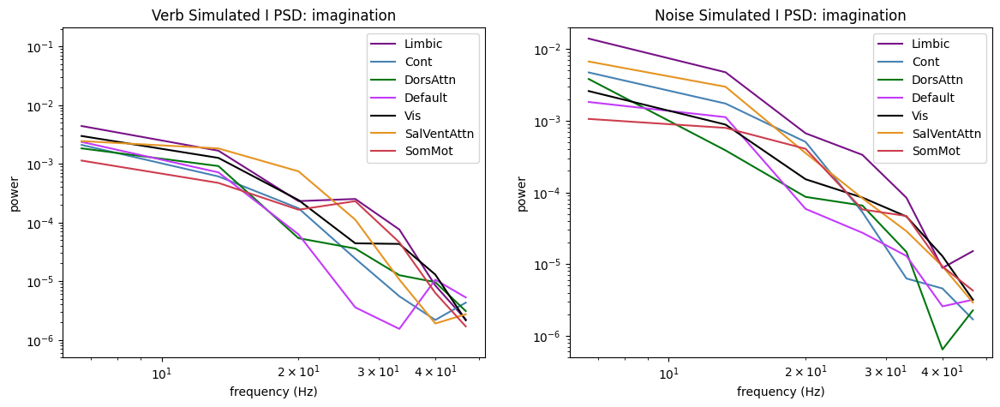

In [ ]:
la = network_activity_verb_df.columns
t_net = network_activity_verb_I_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg=500)

fig, ax = plt.subplots(1,2, figsize=(14,5))
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[0].plot(sim_freqs_source,y, label=idx, color=c )
ax[0].set_xlabel("frequency (Hz)")
ax[0].set_ylabel("power")
ax[0].set_title('Verb Simulated I PSD: imagination')
ax[0].set_xscale("log")
ax[0].legend()
ax[0].set_yscale("log")
ax[0].set_ylim(5e-7,21e-2)
t_net = network_activity_noise_I_df[1000:1500].T.to_numpy()
sim_psd_source, sim_freqs_source = mne.time_frequency.psd_array_welch(t_net,
                                                                      sfreq=1000,fmin=1,fmax=50,n_fft=150, n_per_seg =500)
for y,c, idx in zip(sim_psd_source,colors, la):
    ax[1].plot(sim_freqs_source,y, label=idx, color=c )
ax[1].set_xlabel("frequency (Hz)")
ax[1].set_ylabel("power")
ax[1].set_title('Noise Simulated I PSD: imagination')
ax[1].set_xscale("log")
ax[1].legend()
ax[1].set_yscale("log")
ax[1].set_ylim(5e-7,2e-2)
plt.show()

<Axes: >

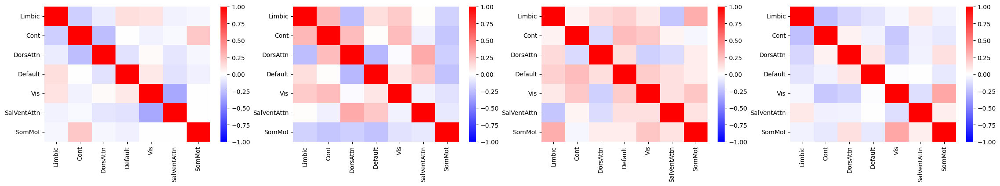

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(28,4))
sns.heatmap(network_activity_verb_df[:600].corr(), cmap='bwr', ax =ax[0], vmax = 1, vmin=-1)
sns.heatmap(network_activity_verb_df[600:1000].corr(), cmap='bwr', ax = ax[1], vmax = 1, vmin=-1)
sns.heatmap(network_activity_verb_df[1000:1500].corr(), cmap='bwr', ax = ax[2], vmax = 1, vmin=-1)
sns.heatmap(network_activity_verb_df[1500:].corr(), cmap='bwr', ax = ax[3], vmax = 1, vmin=-1)

<Axes: >

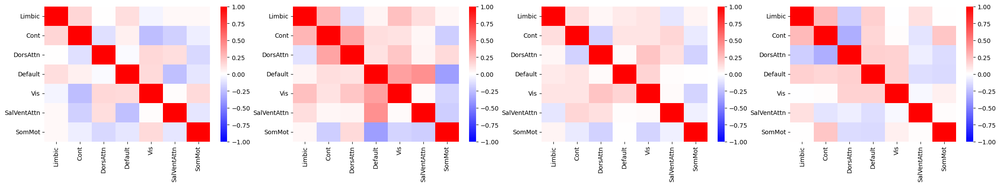

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(28,4))
sns.heatmap(network_activity_noise_df[:600].corr(), cmap='bwr', ax =ax[0], vmax = 1, vmin=-1)
sns.heatmap(network_activity_noise_df[600:1000].corr(), cmap='bwr', ax = ax[1], vmax = 1, vmin=-1)
sns.heatmap(network_activity_noise_df[1000:1500].corr(), cmap='bwr', ax = ax[2], vmax = 1, vmin=-1)
sns.heatmap(network_activity_noise_df[1500:].corr(), cmap='bwr', ax = ax[3], vmax = 1, vmin=-1)

In [ ]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 30.5 MB/s eta 0:00:00


In [ ]:
import mne

In [ ]:
labels[24:24+33]

24                  7Networks_LH_SomMot_11
25                  7Networks_LH_SomMot_12
26                  7Networks_LH_SomMot_13
27                  7Networks_LH_SomMot_14
28                  7Networks_LH_SomMot_15
29                  7Networks_LH_SomMot_16
30            7Networks_LH_DorsAttn_Post_1
31            7Networks_LH_DorsAttn_Post_2
32            7Networks_LH_DorsAttn_Post_3
33            7Networks_LH_DorsAttn_Post_4
34            7Networks_LH_DorsAttn_Post_5
35            7Networks_LH_DorsAttn_Post_6
36            7Networks_LH_DorsAttn_Post_7
37            7Networks_LH_DorsAttn_Post_8
38            7Networks_LH_DorsAttn_Post_9
39           7Networks_LH_DorsAttn_Post_10
40             7Networks_LH_DorsAttn_FEF_1
41             7Networks_LH_DorsAttn_FEF_2
42            7Networks_LH_DorsAttn_PrCv_1
43      7Networks_LH_SalVentAttn_ParOper_1
44      7Networks_LH_SalVentAttn_ParOper_2
45      7Networks_LH_SalVentAttn_ParOper_3
46    7Networks_LH_SalVentAttn_FrOperIns_1
47    7Netw

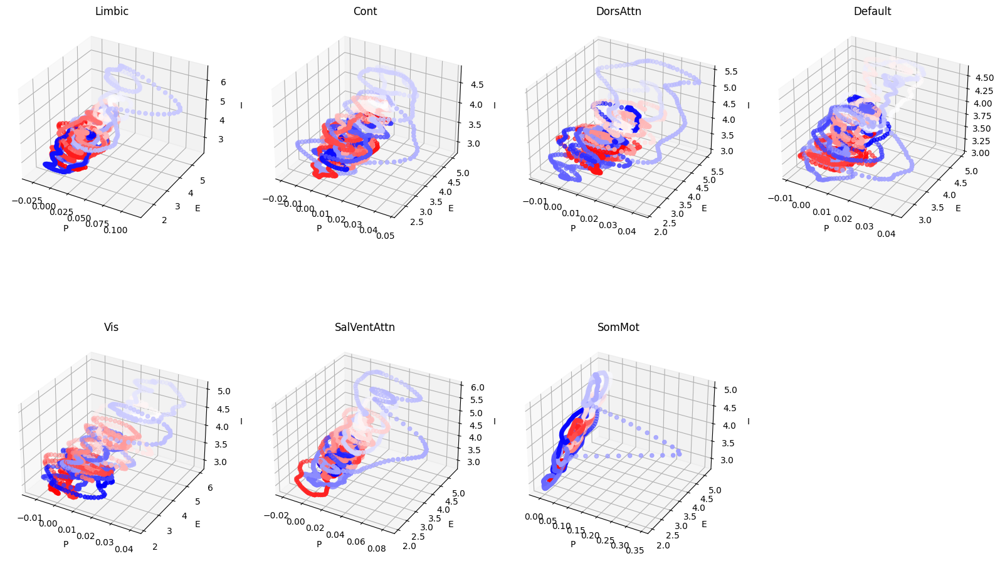

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize = (20, 12))
i= 0
for net in network_name:
  ax= fig.add_subplot(2,4,i+1, projection='3d')
  ax.scatter(network_activity_verb_df[net], network_activity_verb_E_df[net], network_activity_verb_I_df[net], c = np.arange(len(network_activity_verb_df[net])), cmap='bwr')
  ax.set_title(net)
  ax.set_xlabel('P')
  ax.set_ylabel('E')
  ax.set_zlabel('I')
  i += 1

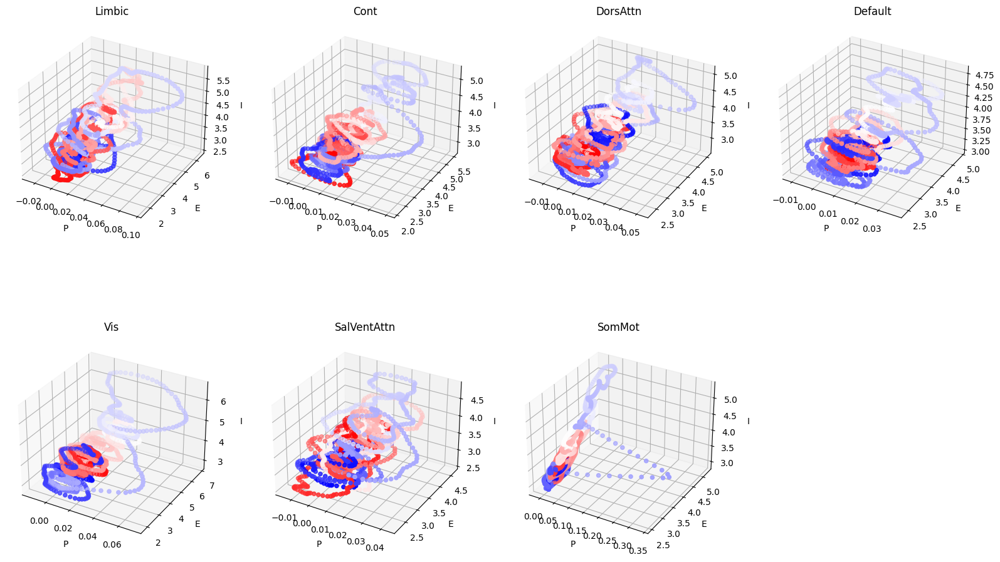

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize = (20, 12))
i= 0
for net in network_name:
  ax= fig.add_subplot(2,4,i+1, projection='3d')
  ax.scatter(network_activity_noise_df[net], network_activity_noise_E_df[net], network_activity_noise_I_df[net], c = np.arange(len(network_activity_verb_df[net])), cmap='bwr')
  ax.set_title(net)
  ax.set_xlabel('P')
  ax.set_ylabel('E')
  ax.set_zlabel('I')
  i += 1

In [ ]:
import numpy as np
from scipy.linalg import fractional_matrix_power

from scipy.stats import norm
from sklearn.cluster import KMeans
from scipy.signal import hilbert

#def eigen(X):
#|
#	#machine epsilon used as tolerance
#	eps = np.finfo(float).eps
#
#	U,D = np.eig(X)
#
#	D = np.diag(D)






def gsvd(A, M=[], W=[], exp=0.5):

	if M == []:
		M = np.identity(A.shape[0])
	if W == []:
		W = np.identity(A.shape[1])

	#save some typing
	matpow = fractional_matrix_power

	Mexp = matpow(M,exp)
	Wexp = matpow(W,exp)

	Ahat = np.matmul(np.matmul(Mexp,A),Wexp)

	U,S,Vt = np.linalg.svd(Ahat)

	Uhat = np.matmul(matpow(M,-exp),U)
	signb = Uhat[0,0] > 0
	sign = 1
	if not signb:
		sign = -1

	Uhat *= sign
	Vhat = np.matmul(matpow(W,-exp),np.transpose(Vt))
	Vhat *= sign
	return (Uhat,S,Vhat)


def get_leads_ts(analytic_signal, n_ev):
    phase=np.angle(analytic_signal)
    #phase=np.unwrap(np.angle(analytic_signal))
    #Leads = []
    """networks = []
    mask = np.tril_indices(phase.shape[1], -1)
    for i in range(phase.shape[0]):
        FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
        FC_inst= 0.5*(FC_inst+FC_inst.T)
        networks.append(FC_inst[mask])
        #Leads.append(FC_inst.ravel())#/np.sqrt((FC_inst.ravel()**2).sum()))
    Y=np.array(networks)

    C = np.corrcoef(Y)#Y.dot(Y.T)
    U, D, V = gsvd(C)#np.linalg.svd(C)
    del networks
    del Y
    weight = U[:,0]/U[:,0].sum()"""
    S_plus = np.zeros((phase.shape[1],phase.shape[1]))
    for i in range(phase.shape[0]):
        FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
        FC_inst= 0.5*(FC_inst+FC_inst.T)
        S_plus += FC_inst/(phase.shape[0])#*weight[i]
    U, D, V = np.linalg.svd(S_plus)#gsvd(S_plus)#
    Ft = U.dot(np.diag(1./D))
    F = U.dot(np.diag(np.sqrt(D)))

    S_transformed = np.zeros_like(phase)

    if n_ev==12:
        for i in range(phase.shape[0]):
            FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
            FC_inst= 0.5*(FC_inst+FC_inst.T)
            Ui, Di, Vi = np.linalg.svd(FC_inst)
            S_transformed.append(FC_inst.dot(Ft[:,:2]).ravel(order='F'))
    else:
        for i in range(phase.shape[0]):
            FC_inst=np.cos(phase[i:i+1,:].T-phase[i:i+1,:])
            FC_inst= 0.5*(FC_inst+FC_inst.T)
            S_transformed[i,:] = FC_inst.dot(Ft)[:,n_ev-1]

    return S_transformed



def plot_centers(centers, labels, labels_ls, Noev, y_L,y_H, thresh):
    num_subplots=centers.shape[0]
    if num_subplots %3 ==0:
        num_rows = num_subplots//3
    else:
        num_rows = num_subplots//3 +1
    fig, ax = plt.subplots(num_rows, 3, figsize=(12,8))
    for i in range(num_subplots):
        if num_rows> 1:
            ax[i//3, i%3].plot(centers[i,:])
            ax[i//3, i%3].set_ylim([y_L, y_H])
            ax[i//3, i%3].set_title(str(100*np.sum(labels==i)/len(labels)) + "%")
            """if Noev == 1:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:].argmax()], (centers[i,:].argmax(), centers[i,:].max()))
            elif Noev == 2:
                rois=np.arange(len(labels_ls))[np.abs(centers[i,:]) >=thresh]
                print(rois+1)
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i//3, i%3].annotate(labels_ls[rois[roi]], (rois[roi], centers[i,rois[roi]]))
            else:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:len(labels_ls)].argmax()], (centers[i,:len(labels_ls)].argmax(), centers[i,:len(labels_ls)].max()))
                rois=np.arange(len(labels_ls))[np.abs(centers[i,len(labels_ls):]) >=thresh]
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i//3, i%3].annotate(labels_ls[rois[roi]], (len(labels_ls)+rois[roi], centers[i,len(labels_ls)+rois[roi]]))
                """
        else:
            ax[i%3].plot(centers[i,:])
            ax[i%3].set_ylim([y_L, y_H])
            ax[i%3].set_title(str(100*np.sum(labels==i)/len(labels)) + "%")
            """if Noev == 1:
                ax[i%3].annotate(labels_ls[centers[i,:].argmax()], (centers[i,:].argmax(), centers[i,:].max()))
            elif Noev == 2:
                rois=np.arange(labels_ls)[np.abs(centers[i,:]) >=thresh]
                print(rois+1)
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i%3].annotate(labels_ls[rois[roi]], (rois[roi], centers[i,rois[roi]]))
            else:
                ax[i//3, i%3].annotate(labels_ls[centers[i,:labels_ls].argmax()], (centers[i,:labels_ls].argmax(), centers[i,:labels_ls].max()))
                rois=np.arange(labels_ls)[np.abs(centers[i,labels_ls:]) >=thresh]
                if len(rois)>0:
                    for roi in range(len(rois)):
                        ax[i%3].annotate(labels_ls[rois[roi]], (labels_ls+rois[roi], centers[i,labels_ls+rois[roi]]))"""




def leads_train(X, n_clusters):


    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    return labels, centers


class PLS_cluster:

    def __init__(self, data):
        self.data = data


    def get_cluster_num(self, threshold=1.5):
        u,s,v = np.linalg.svd(self.data, full_matrices=False)
        s.sort()
        s=s[::-1]
        s_n = s-s.min()+0.1
        #print(s_n)
        rank = np.log(s_n[:-1]-s_n[1:])
        #print(rank)
        print(s_n >= threshold)

        self.cluster_n = (s_n >= threshold).sum()
        self.X = self.data.dot(v.T[:,:self.cluster_n])
        self.v=v


    def get_labels(self):
        kmeans = KMeans(n_clusters=self.cluster_n, random_state=0).fit(self.X)
        self.labels = kmeans.labels_
        self.centers = kmeans.cluster_centers_
        data_new = []
        cluster_info = []
        for i in range(self.cluster_n):
            data_new.append(self.data[np.where(kmeans.labels_ == i)])
            cluster_info.append(self.data[np.where(kmeans.labels_ == i)].shape[0])
        self.data_new = np.concatenate(data_new, axis = 0)
        self.cluster_info = np.array(cluster_info)

    def validation(self, perm_n =500):
        cluster_mean = []
        for i in range(self.cluster_n):
            if i == 0:
                cluster_mean.append(self.data_new[:self.cluster_info[0]].mean(0))
            else:
                cluster_mean.append(self.data_new[self.cluster_info[:i].sum():self.cluster_info[:i].sum()+self.cluster_info[i]].mean(0))
        #print(cluster_mean)
        R = np.array(cluster_mean).dot(np.array(cluster_mean).T)

        d,u =np.linalg.eigh(R)
        d.sort()
        d=d[::-1]
        eg= (d[-2]-d[-1])
        #print(eg)
        egs_perm = []
        for i in range(perm_n):
            ind = np.arange(self.data.shape[0])
            np.random.shuffle(ind)
            data_new = self.data[ind]
            #print(data_new.shape)
            cluster_mean = []
            for i in range(self.cluster_n):
                if i == 0:
                    cluster_mean.append(data_new[:self.cluster_info[0]].mean(0))
                else:
                    cluster_mean.append(data_new[self.cluster_info[:i].sum():self.cluster_info[:i].sum()+self.cluster_info[i]].mean(0))
            #print(cluster_mean)
            R = np.array(cluster_mean).dot(np.array(cluster_mean).T)

            d,u =np.linalg.eigh(R)
            d.sort()
            d=d[::-1]
            egs_perm.append(d[-2]-d[-1])
            #print(d.min())
        z = (eg - np.array(egs_perm).mean())/np.array(egs_perm).std()
        self.egs_perm = np.array(egs_perm)
        self.p_value = norm.sf(z)


# @title function for Markov Chain

In [ ]:
P =np.concatenate([network_activity_verb_df.values, network_activity_noise_df.values],0)
E = np.concatenate([network_activity_verb_E_df.values, network_activity_noise_E_df.values],0)
I =  np.concatenate([network_activity_verb_I_df.values, network_activity_noise_I_df.values],0)

In [ ]:
centers_trained_2nd.shape

(8, 7)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


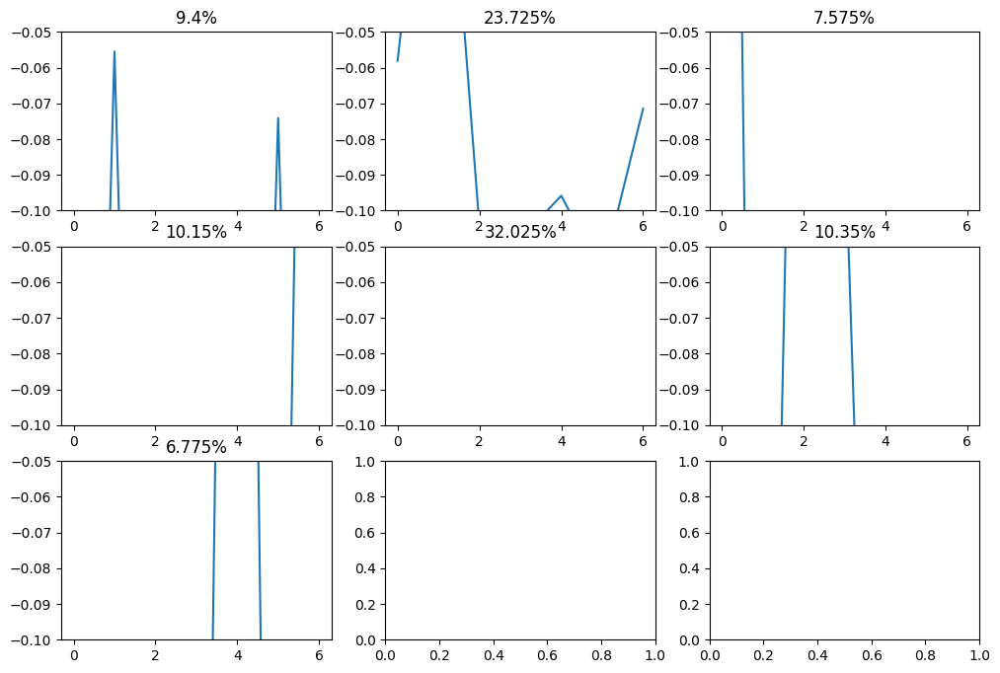

In [ ]:
analytic_signal =( E-E.mean(0))+(I-I.mean(0))*complex(0,1)
Leads_trained_2nd = get_leads_ts(analytic_signal, 1)



X_trained_2nd = np.array(Leads_trained_2nd)

labels_trained_2nd, centers_trained_2nd = leads_train(X_trained_2nd, 7)
labels = list(network_activity_verb_df.columns)
plot_centers(centers_trained_2nd, labels_trained_2nd, labels, 1, -0.1, 0.-0.05, 0.1)

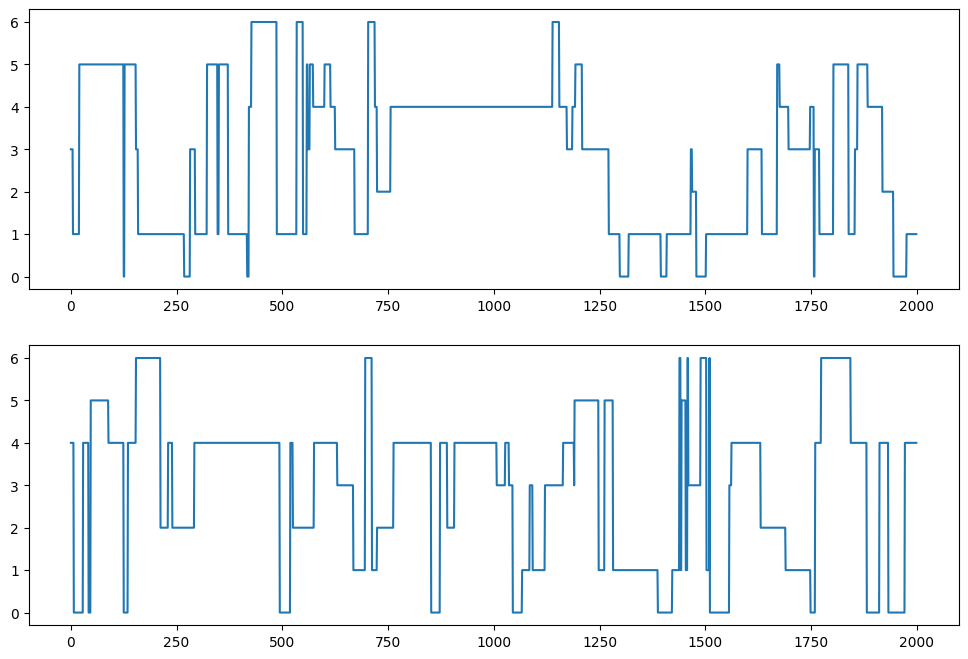

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(12,8))
ax[0].plot(labels_trained_2nd[:2000])
ax[1].plot(labels_trained_2nd[2000:])

IndexError: ignored

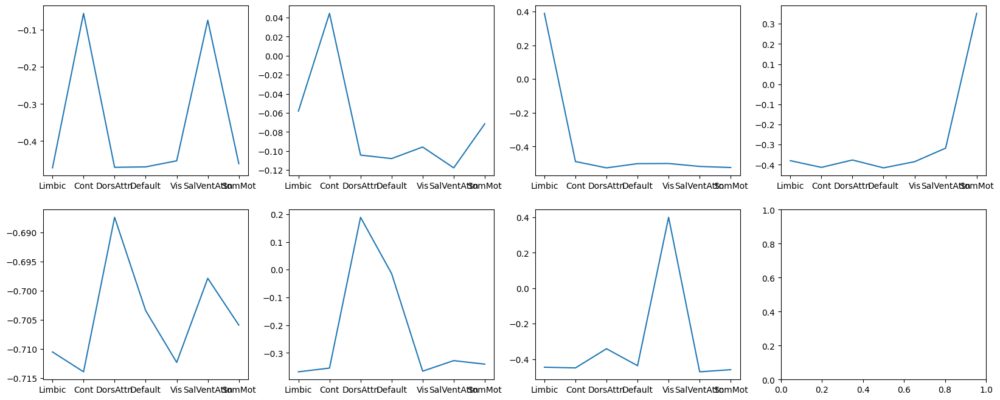

In [ ]:
fig, ax = plt.subplots(2,4, figsize = (20,8))
for i in range(8):
   ax[i//4, i%4].plot(centers_trained_2nd[i])
   ax[i//4, i%4].set_xticks(np.arange(7))
   ax[i//4, i%4].set_xticklabels(list(network_activity_df.columns))

In [ ]:
def get_transitionprob(labels, num_clusters):
  M =np.zeros((num_clusters,num_clusters))
  pre_labels = labels[: len(labels)-1]
  post_labels = labels[1:]
  cluster_sum = np.zeros((num_clusters,))
  for i in range(len(labels) -1):
      M[pre_labels[i], post_labels[i]] +=1
      cluster_sum[pre_labels[i]] += 1
  M = np.nan_to_num((M.T/cluster_sum).T)
  return M

In [ ]:
M_verb = get_transitionprob(labels_trained_2nd[:2000], 7)
M_noise = get_transitionprob(labels_trained_2nd[2000:], 7)

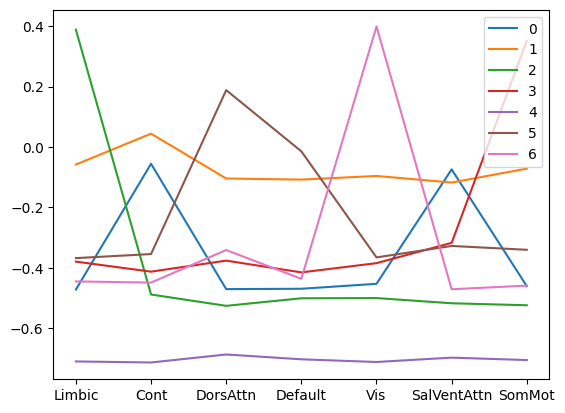

In [ ]:
fig, ax = plt.subplots(1,1)
ax.plot(centers_trained_2nd.T)
ax.set_xticks(np.arange(7))
ax.set_xticklabels(list(network_activity_df.columns))
ax.legend(np.arange(7))

<Axes: >

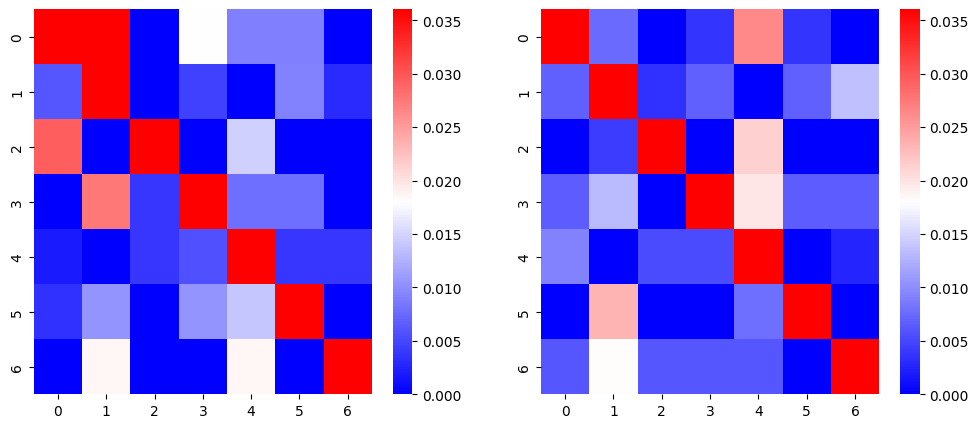

In [ ]:
vm = max([(M_verb-np.diag(np.diag(M_verb))).max(), (M_noise-np.diag(np.diag(M_noise))).max()])
fig, ax = plt.subplots(1,2, figsize =(12,5))
sns.heatmap(M_verb, cmap='bwr', vmax=vm, vmin=0, ax=ax[0])
sns.heatmap(M_noise, cmap='bwr', vmax=vm, vmin=0, ax=ax[1])